In [1]:
import numpy as np
import cv2  
import matplotlib.pyplot as plt
image_height =11165 
image_width =11776 

mask = np.zeros((image_height, image_width), dtype=np.uint8)

yolo_annotation = """
0 0.9865375444745337 0.01601307417083801 0.9866502010061275 0.021835333238139115 0.9905931796119127 0.021775922431329916 0.9939165472939316 0.022607673726658648 0.9972962432417476 0.023380014215178182 0.9997746869368125 0.02444940873774369 0.9998310152026094 0.016310128204883985
0 0.9933895754188724 0.02362793614728699 0.9922257682743078 0.026033828323857696 0.99874308828387 0.03153301044173359 0.999767238571087 0.03168030996274812 0.9998137908568695 0.02554282992047592 0.9979516994255662 0.024806332315403253 0.9959033988511322 0.024217134231345125
0 0.8480610626772908 0.02146755884215494 0.8485186847102736 0.022618529725565426 0.8485186847102736 0.02376950060897591 0.8482018694566701 0.024809087213346667 0.8476738440339975 0.026294210933876315 0.8473570287803941 0.02837338414261784 0.8473922304752388 0.029115946002882663 0.8543621660545171 0.028967433630829702 0.8543269643596723 0.021356174563115216
0 0.8473101901616333 0.015611350468029249 0.8465828824169053 0.01628640670463364 0.8464374208679595 0.017391044182713544 0.8467283439658508 0.01837294416322902 0.8466992516560617 0.01987647850839334 0.8473683747812116 0.021226590981602116 0.8544087137501797 0.021195906607211004 0.8544087137501797 0.015243137975335948
0 0.8789157177037219 0.02953224383468153 0.8766698495726211 0.03594426549806831 0.8770570682159143 0.038027151516111156 0.8915390454750818 0.038149674223054854 0.8929330325909375 0.03757790159065094 0.8930879200482547 0.03692444715361789 0.8937849136061825 0.0368019244466742 0.894094688520817 0.0307574709041185 0.891810098525387 0.028511221276817395 0.891810098525387 0.029328039323108707
0 0.8653630651884583 0.04762476356003406 0.8655179526457757 0.04905419514104384 0.8847627192174499 0.049217558750302114 0.8851499378607431 0.0389256513670316 0.8774830087235369 0.03900733317166073 0.8766698495726211 0.04035508294804138 0.8772893994018902 0.04084517377581618 0.8778315055025009 0.04125358279896184 0.8784897771960993 0.04190703723599489 0.8786833865177459 0.04288721889154445 0.8789931614323805 0.043581514230892064 0.8785672209247579 0.044112445960981427 0.8779476710954888 0.04403076415635229 0.8777927836381714 0.0436631960355212 0.878334889738782 0.043336468817004675 0.8782961678744526 0.042601332575342495 0.8782574460101233 0.042192923552196844 0.877986392959818 0.04190703723599489 0.8774442868592076 0.04145778731053466 0.8763987965223159 0.04084517377581618 0.8754694717784121 0.04198871904062401 0.8738044316122512 0.042519650770713374 0.8724878882250541 0.04268301437997163 0.871403676023833 0.043050582500802716 0.8704743512799291 0.04415328686329599 0.8690029204354148 0.04599112746745144
0 0.8695450265360255 0.03259531150827394 0.8696224702646841 0.04337730971931924 0.8686931455207803 0.044929264007272735 0.867337880269254 0.04599112746745144 0.8659438931533983 0.04652205919754079 0.8640077999369321 0.046603741002169914 0.8619168192631484 0.04525599122578925 0.8609487726549153 0.044602536788756204 0.8599807260466822 0.043050582500802716 0.859593507403389 0.04113106009201814 0.8596709511320476 0.03912985587860442 0.8598258385893651 0.03676108354435963 0.8606777196046101 0.035168288354091574 0.8616844880771726 0.03394306128465461 0.8635818594293094 0.03304456143373417 0.866021336882057 0.03218690248512829 0.8679574300985231 0.032023538875870027 0.8691578078927321 0.032023538875870027
0 0.8567286950920138 0.04220277696118173 0.8566493524289526 0.04435068316855932 0.8546657858524214 0.04451805248341992 0.8545599956350063 0.04939965750018718 0.8634199263435123 0.049427552385997296 0.8636050592239886 0.047363330836049974 0.8627851850390224 0.046889117777278305 0.8617272828648724 0.046470694490126835 0.8608280660168449 0.045884901888114754 0.8601668771580012 0.04510384508543199 0.8600610869405861 0.044629632026660315 0.8585271287880687 0.046191745632025834 0.8579981777009936 0.04638700983269653 0.8578130448205176 0.045857007002304655 0.8584213385706537 0.04546647860096327 0.8598230589514024 0.04435068316855932 0.8593998980817424 0.043513836594256367 0.8590560798751438 0.042398041161852425
0 0.8565700097658911 0.029789552775687803 0.8585535763424226 0.02792059542641119 0.859135422538205 0.028255334056132373 0.8600081918318787 0.028171649398702082 0.8605900380276611 0.02761375168250011 0.861462807321335 0.028311123827752572 0.8619917584084098 0.029175865287865633 0.8626000521585461 0.030012711862168594 0.8633405836804511 0.031044822637142245 0.8637637445501111 0.0318816692114452 0.863129003245621 0.032383777156026985 0.86220333884324 0.032690620899938065 0.8613834646582736 0.03322062373032994 0.8609074086799062 0.03369483678910162 0.8602197722667086 0.03425273450530359 0.8597966113970485 0.03495010665055606 0.8594263456360962 0.035396424823517646 0.8565171146571838 0.03508958107960656
0 0.9508082366157445 0.022401631961336627 0.9508402381565125 0.023650485999054744 0.9501362042596156 0.02361673318722453 0.9500401996373117 0.025844418768019007 0.9404397374069007 0.025878171579849233 0.9404397374069007 0.017102440503992178 0.946040007041307 0.016866170821180644 0.946040007041307 0.017845002364257005 0.9501682058003837 0.01808127204706854 0.9501362042596156 0.01868882266001249 0.9507442335342084 0.020072687945051487 0.9509042412380488 0.021321541982769608 0.9499121934742395 0.021321541982769608 0.9497521857703992 0.021017766676297633 0.9484081210581418 0.020815249805316315 0.9482161118135335 0.021389047606430043 0.9438639022690807 0.021389047606430043 0.9445039330844412 0.02483183441311242 0.9487601380065902 0.024764328789451985 0.948728136465822 0.02294167695062014 0.9499761965557755 0.02284041851512948 0.9501042027188477 0.022401631961336627
0 0.8849470952656998 0.06928099178945758 0.8849931866377616 0.07329162231213052 0.8957785677002622 0.0730242469439523 0.8956745764227999 0.06895941451616683
0 0.8963123538445905 0.06893572138385429 0.8964324852171431 0.0729058274312934 0.9072443087468859 0.07307476811416314 0.9072443087468859 0.06897795655457173
0 0.907935109426696 0.06894905806688736 0.9078043443589513 0.07306698900530478 0.911783338563181 0.07292906787339606 0.9119141036309256 0.06900816712341969
0 0.9123998024539772 0.06898846410457557 0.9122503566622691 0.07285025579801967 0.91905014018499 0.07283055277917555 0.9190127787370631 0.06873232485960223
0 0.8435585580074725 0.07285802569173613 0.8434081305437201 0.07904574792306615 0.8536071125861353 0.07682451430156308 0.8526142913253694 0.07225511942304244
0 0.9081220254500189 0.0777130077501643 0.9081821964355197 0.08063234336699693 0.9127251058408433 0.08075927100251139 0.9124844218988393 0.077490884388014
0 0.8560139520061741 0.0857094487875754 0.8564953198901821 0.08767682713804956 0.8846553411046384 0.0873277761403848 0.884444742655385 0.08079100291139002 0.8792700379023012 0.08079100291139002 0.8764420015837553 0.08082273482026862 0.8736741362507103 0.08133044536232648 0.8705753304974102 0.08186988781326293 0.8674464392513594 0.08253625789971383 0.8654006257443263 0.08310743225952893 0.8625725894257805 0.08367860661934401 0.8586915608609677 0.08485268724785279
0 0.8264699981251955 0.07615814421511216 0.8431373611089658 0.07657065903053416 0.8428365061814609 0.08640755078290495 0.839888127891913 0.08640755078290495 0.8377520579066284 0.08640755078290495 0.8350744490518349 0.08577291260533264 0.8331790630085544 0.08491615106561003 0.8311934204870223 0.08374207043710126 0.8293582054292423 0.0822189388109277 0.8280344437482209 0.08037848809596802 0.8269212805164529 0.0782841821099794
0 0.8421483824731186 0.06533172232756794 0.8418997420371642 0.0763461039217981 0.8431429442169365 0.0763461039217981 0.8434593956808785 0.06537940363317067
0 0.715074053672213 0.06281717079504223 0.7152993667354007 0.07119409455513871 0.7245372023260975 0.07101586213471113 0.7241992327313159 0.06246070595418706
0 0.7152993667354007 0.07238231069132262 0.7155810080643854 0.08034335880375472 0.7155727339406951 0.08204789819329177 0.7224135841789061 0.08213951994483129 0.7229347918161032 0.08220823625848592 0.7228044899068041 0.08543790300025393 0.7236751665267378 0.08599203540003428 0.7239004795899255 0.08664555427493542 0.7239004795899255 0.08747730557026415 0.7315047954725112 0.08759612718388253 0.7315047954725112 0.07678336034460904 0.730828856282948 0.07660512792418146 0.730828856282948 0.07773393325355618 0.7298149474986033 0.07785275486717456 0.7293643213722278 0.0774368792195102 0.7241821209189102 0.07725864679908262 0.7239004795899255 0.07238696064072862
0 0.7330802497716453 0.07653068073520912 0.733118722735102 0.08180587019302984 0.7496236240580194 0.0817247134321403 0.7496620970214761 0.07632778883298524
0 0.7750927258663444 0.08140008638858211 0.7750542529028877 0.0872433731726297 0.7766701173680685 0.08744626507485358 0.7768240092218952 0.09397938432646233 0.7712839024841327 0.09410111946779667 0.771245429520676 0.0874056866944088 0.7712069565572193 0.08419999463927158 0.7704759702515424 0.08298264322592833 0.7698219298727786 0.08318553512815222 0.7698604028362352 0.08639122718328944 0.7701297135804321 0.0887041948686416 0.7703605513611723 0.09036790846687738 0.7703990243246289 0.09203162206511313 0.7703605513611723 0.09515615735936081 0.7784014007236192 0.09544020602247423 0.7780936170159659 0.09296492481534296 0.7778243062717689 0.0903273300864326 0.7778243062717689 0.08850130296641773 0.7783629277601625 0.08687816774862672 0.7782090359063357 0.08176529181258509 0.7782090359063357 0.07766687538766281 0.7776704144179422 0.07673357263743301 0.7760930229162181 0.07498870227830767 0.7746695232683208 0.07373077248451965 0.7735922802915336 0.0730003616365137 0.7705529161784556 0.07291920487562416 0.7691294165305584 0.07291920487562416 0.769167889494015 0.07344672382140624 0.7672442413211807 0.07332498868007191 0.7599343782644108 0.07352788058229578 0.7598959053009541 0.07291920487562416 0.7586262975068834 0.07291920487562416 0.7588571352876237 0.07401482114763308 0.7579722571281199 0.07433944819119127 0.7568180682244193 0.07433944819119127 0.7568565411878762 0.07502928065875246 0.7524742982632172 0.07498383998394047 0.750336863988461 0.07513872273447685 0.749765793762381 0.07506988595646068 0.7495699982562966 0.07438151817629902 0.7488520814006532 0.07422663542576265 0.7467309634180708 0.07414058945324244 0.743663500489413 0.07405454348072223 0.7402860280094548 0.07407175267522628 0.7381975426112197 0.07402012509171416 0.737218565080797 0.07372756878514544 0.7359458942912476 0.07348664006208885 0.7346405909173506 0.07315966536651206 0.7342000510286604 0.07264338953139081 0.7343632139503975 0.07032014827334519 0.7342212911872379 0.0696379569833527 0.7350899705825662 0.0685343313398085 0.7362942761079079 0.0677014063258129 0.7347148590254927 0.06636872630341992 0.7341620630466472 0.0653067469105755 0.7341225776195869 0.06232903998554118 0.7327998158130642 0.06220410123344184 0.7328985293807151 0.0677014063258129 0.7330451160109511 0.07636661292484616 0.7657715263701428 0.07624671168825145 0.7696284333061524 0.07624819530578825 0.7710366399510759 0.07654524933983423 0.7724448465959991 0.07725817902154455 0.7736277401777346 0.0780899303168733 0.7747543054936733 0.08016930855519512
0 0.7333614992102198 0.08275752924285054 0.7332343158599496 0.08835801646126162 0.7339656201240023 0.08835801646126162 0.7342199868245423 0.08772083528072383 0.7399432375866938 0.08775437113233109 0.7400068292618287 0.0901689524480532 0.7428048629677694 0.09013541659644597 0.7429956379931746 0.08815680135161812 0.7529159393142367 0.08788851453876009 0.7533928768777494 0.0901689524480532 0.7546965062180173 0.08990066563519522 0.7545693228677472 0.08748608431947308 0.7569540106853103 0.08751962017108031 0.7570176023604452 0.08245570657838527
0 0.73822609561487 0.03434643026911398 0.73804021233774 0.04290752753031898 0.7399610062014154 0.042842175642828856 0.7401468894785452 0.04767821531709733 0.7415719946032077 0.048331734191998474 0.741510033510831 0.050292290816701904 0.7485116369493895 0.05035764270419203 0.748077909302753 0.03388896705668318
0 0.7329984171327818 0.053453373507368715 0.7329137766131769 0.06099689443205237 0.7362993973973653 0.061041530650541624 0.7363417176571676 0.05791699535629395 0.7367225999953888 0.05742599695291218 0.7376959659708429 0.056667181238594884 0.7412085475344381 0.056667181238594884 0.7410815867550311 0.05434609787715376 0.7409742168227692 0.053435228604812056
0 0.7423760209990133 0.053377991105919065 0.7423124293238783 0.05683218382146602 0.7435206711514436 0.05780472351807633 0.7435206711514436 0.05431699495092212 0.7531230140968309 0.05441760250574387 0.7567795354170943 0.054652353466994645 0.7565251687165542 0.05310970429306105
0 0.6855181875605366 0.15857754853512532 0.6857377232700803 0.1841637915241316 0.6953972944900009 0.18474266579990098 0.6952875266352291 0.186595063482363 0.7043982585812907 0.18763703717874786 0.706703383531499 0.18451111608959322 0.7099964191746537 0.1802274464488999 0.7155945797680167 0.1732809551396674 0.7096671156103382 0.16864996093351242 0.7152652762037013 0.16112459534851056 0.7091182763364791 0.15765134969389433 0.703520115743116 0.16482939071343453 0.6996782408261021 0.16205079418974155 0.7056057049837807 0.1540623291841242 0.7011052229381359 0.15163105722589282 0.6949582230709136 0.15927219766604858 0.6927628659754771 0.15823022396966369
0 0.9385204947354749 0.03251486618895938 0.9385628149952773 0.04952126543336454 0.9439176711514663 0.04963024027025878 0.9439642234372488 0.048255444740789806 0.9434521482936404 0.04820634490045163 0.9433124914362927 0.03264169551324932
0 0.9443103849619793 0.048984993839342475 0.944288667977096 0.04971796785165863 0.9543870659477885 0.04955762978646447 0.9543653489629054 0.04887046664991808 0.9451790643573077 0.04900789927722735 0.9453093662666069 0.0482978307027961 0.9447447246596434 0.04822911438914145 0.9447881586294098 0.04903080471511224
0 0.8964287726966397 0.038341831382546133 0.8961325308780232 0.04936697734939148 0.9084477264805078 0.04909916003845596 0.9084477264805078 0.046063897181186794 0.906670275568809 0.04624244205514381 0.9050621056963195 0.046019260962697546 0.9035808966032373 0.04534971768535876 0.9022689685493642 0.04459090197104147 0.9012956025739102 0.04360890516427793 0.9004915176376654 0.04226981860960034 0.900195275819049 0.0413770942398153 0.9000259947798397 0.04012728012211623 0.8999836745200372 0.03829719516405688
0 0.8665544538831046 0.12655866900385432 0.8665544538831046 0.13664645438242537 0.8769652377944833 0.13686963547487163 0.8768805972748785 0.12691575875176836 0.8760765123386338 0.12655866900385432
0 0.8335199365122734 0.15490621091826373 0.8328271646944989 0.15568728635013812 0.8322060589268392 0.15568728635013812 0.8311310681751203 0.1551581707349974 0.830533851090832 0.15470464306487677 0.8301277434735159 0.1544526832481431 0.8290049753550541 0.15442748726646974 0.8281449827536789 0.15465425110153005 0.8267116617513871 0.15490621091826373 0.8255411162661821 0.1554605225150778 0.824633346298064 0.15573767831348484 0.8236777989632027 0.15611561803858534 0.8228416950451991 0.1562415979469522 0.8220294798105671 0.1562415979469522 0.821933925077081 0.15682110552543962 0.8218144816602233 0.1578541407740477 0.8216233721932511 0.15853443227922862 0.8212650419426781 0.15944148761946983 0.8221011458606817 0.15981942734457033 0.8232955800292584 0.1600209951979573 0.824322793414234 0.16029815099636432 0.824322793414234 0.1592399197660829 0.824943899181894 0.1592399197660829 0.8249916765486368 0.15805570862743462 0.8258277804666405 0.15805570862743462 0.825803891783269 0.15732502515890698 0.8350965896147945 0.15717384926886677 0.8377243447856628 0.15704786936049994 0.8377960108357773 0.15651875374535923 0.8393726639382985 0.15646836178201248 0.839802660238986 0.15722424123221349 0.8461570500158132 0.1571486532871934 0.845153725314209 0.15611561803858534 0.8445565082299207 0.1553597385883843 0.8437681816786601 0.15470464306487677 0.8430754098608858 0.15394876361467574 0.8421676398927675 0.15331886407284157 0.8411165378244202 0.15258818060431392 0.8397071055055 0.1518071051724395 0.8388232242207533 0.15135357750231893 0.8376765674189198 0.1508244618871782 0.8368404635009162 0.15049691412542443 0.8360760256330273 0.15032054225371086 0.8357176953824543 0.1515047533923591 0.8362671350999995 0.15231102480590689 0.8366254653505724 0.15253778864096718 0.8366971314006871 0.153142492201128 0.8363865785168572 0.15331886407284157 0.8355265859154819 0.1531928841644747 0.8350010348813083 0.15263857256766064 0.8347860367309646 0.15344484398120842 0.8342843743801623 0.15382278370630892 0.8336154912457594 0.153898371651329 0.8333288270453012 0.15394876361467574 0.8334482704621589 0.15467944708320341
0 0.8007578708712196 0.15595938175729 0.8009502356885031 0.1704864419565194 0.8011041275423298 0.18537870757975183 0.8011611640091245 0.1882074986240992 0.8030505416939637 0.18818459318621428 0.8030288247090805 0.1874058082981284 0.8038106361648761 0.1873829028602435 0.803919221089292 0.18564208958099268 0.8075242405799049 0.18550465695368343 0.8076111085194378 0.18250404459076422 0.8041798249078905 0.18232080108768514 0.8042232588776571 0.17496815552663886 0.8042666928474235 0.17091389302101523 0.8050485043032191 0.1705932168906269 0.8057000138497152 0.17015801357081417 0.8066772781694599 0.1702725407602386 0.8072636367613064 0.1699289591919654 0.8075893915345546 0.169241796055419 0.8075025235950217 0.16793618609598088 0.8074373726403721 0.16738645558674378 0.8062429384717956 0.16743226646251352 0.8058085987741314 0.167340644710974 0.8057868817892482 0.16699706314270085 0.806090919577613 0.16663057613654275 0.8066121272148101 0.16644733263346376 0.8074321011352272 0.16645793354420202 0.807458378686936 0.16407439367790147 0.8068014398942188 0.16379723787949443 0.8061970562049191 0.16327064186252108 0.8063021664117539 0.16263318352618486 0.8071693256181405 0.16238374330761854 0.8073532684801011 0.1622728809882557 0.8074846562386446 0.16024964365988434 0.8068014398942189 0.1594181762646632 0.8063284439634627 0.15853127770976067 0.8063284439634627 0.15764437915485816 0.80638099906688 0.15664661828059281 0.8063284439634627 0.15551027950712393
0 0.967910496076719 0.08616434628499542 0.9659745111189086 0.08922180987602861 0.9699102952805273 0.09042698777523843 0.9700372560599344 0.09002526180883513 0.9878540854367249 0.0898913531533674 0.9883196082945509 0.10247876676733657 0.9878540854367249 0.10247876676733657 0.9878964056965271 0.10296976517071833 0.9741423212607626 0.1031929462631646 0.9712222233344003 0.10082722668323423 0.970599434304726 0.10135272449649559 0.9700782266675289 0.10213150938458149 0.9698176228489302 0.10277286164535811 0.9698176228489302 0.10648354258270859 0.976506454192959 0.1065751643342481 0.9922947022030526 0.10632320451751444 0.9922295512484028 0.09619900097239771 0.9921818854420446 0.09521406714334792 0.9918126966990299 0.08770108351710747 0.9916606778048476 0.08632675724401469
0 0.9715745212146484 0.09164491915644742 0.9715745212146484 0.0911754172339459 0.9711611753262708 0.09130956064037492 0.9710021961384334 0.09174552671126919 0.9710657878135681 0.09198027767251996 0.9714473378643782 0.09211442107894895 0.9696349751230303 0.09734601392968027 0.9694124042600578 0.09741308563289477 0.9691580375595179 0.09727894222646576 0.9691580375595179 0.09774844414896729 0.9693170167473554 0.0978825875553963 0.9695077917727604 0.0975472290393238 0.9701755043616781 0.09801673096182531 0.9698893418235704 0.09835208947789782 0.9705252585749207 0.0989221989552211 0.9710021961384334 0.09835208947789782 0.9724966005041061 0.09999534620665317 0.9721786421284311 0.1003977764259402 0.9728145588797811 0.10083374249683448 0.9732914964432937 0.1003977764259402 0.974308963245454 0.101437387825765 0.9739592090322113 0.10187335389665927 0.9747541049713991 0.10204103315469554 0.9747859008089667 0.10153799538058676 0.9759305509613969 0.10153799538058676 0.9778700970530148 0.10157153123219402 0.9778700970530148 0.10197396145148102 0.97831523877896 0.10200749730308828 0.9785378096419325 0.10173921049023027 0.9785696054795001 0.10116910101290699 0.9782198512662573 0.10110202930969249 0.9780926679159875 0.09848623288432683 0.9797460514694979 0.09845269703271958 0.9798096431446328 0.10093435005165623 0.980127601520308 0.1012361727161215 0.980699926596523 0.10147092367737225 0.9816855975611157 0.1013703161225505 0.9862324023332694 0.10147092367737225 0.9861688106581343 0.10187335389665927 0.9868047274094846 0.10183981804505203 0.9869637065973219 0.1013703161225505 0.9865185648713768 0.10116910101290699 0.9862006064957017 0.09181259841448369 0.986645748221647 0.09177906256287643 0.9866139523840793 0.09147723989841117 0.9861688106581343 0.0911754172339459 0.9857554647697567 0.0911754172339459 0.9858190564448917 0.09167845500805467 0.9796824597943627 0.09164491915644742 0.9797460514694979 0.09483082505913637 0.9780926679159875 0.09493143261395812 0.9779336887281499 0.09181259841448369
0 0.9656207088738377 0.09017887867994218 0.9643511010797671 0.09308023288174355 0.9634623756239177 0.09553522489865246 0.9628698919866846 0.0975438547306688 0.9624466893886613 0.09928466725174964 0.9619811665308353 0.10227529389052957 0.9680329636825717 0.10245383876448658 0.9700220158932822 0.09982030187362068 0.9677790421237575 0.09767776338613658 0.9697257740746659 0.09138405657915198 0.9690063296580259 0.0909823306127487 0.9688793688786188 0.09133942036066273 0.9675674408247459 0.09107160304972722 0.9676520813443507 0.09084842195728095
0 0.6821811794328176 0.008230475162888409 0.685583334052541 0.008331082717710164 0.6892716512103719 0.008196939311281157 0.693087151718473 0.00806279590485215 0.6958533895868458 0.0077274373887796285 0.6963303271503585 0.008968263898247952 0.6967118772011687 0.010879807439861316 0.6970298355768437 0.012087098097722387 0.6974113856276538 0.01349560386522697 0.6976975481657616 0.015138860593982319 0.6976657523281939 0.01708393998720293 0.6976339564906264 0.018961947677209042 0.6972524064398163 0.02097409877364416 0.6968390605514387 0.021812495063825463 0.6948995144598207 0.02063874025757164 0.6899711596368572 0.018425374051493013 0.6869823509055114 0.016983332432381176 0.6866325966922688 0.016748581471130414 0.6841843171995707 0.021611279954181953 0.6843432963874083 0.015809577626127357 0.6818950168947101 0.01567543421969835 0.6817996293820076 0.014937645484338805 0.6803052250163348 0.014803502077909798 0.6804003377590082 0.0134851180495941 0.6818770927310664 0.013324779984399945 0.6818119417764169 0.012981198416126754 0.6822679984589644 0.012935387540356995 0.682333149413614 0.009866058863783153 0.6820725455950154 0.009659909922819237 0.6820508286101322 0.00876659784530894 0.6841573761438036 0.008835314158963579 0.6843093950379859 0.014538768192298554 0.6944295099935619 0.014355524689219518 0.6941689061749634 0.009339233792430925 0.6843311120228692 0.009407950106085562 0.6842240818415971 0.009380113636391147 0.6841980874740105 0.008787908626959537 0.6832239322688238 0.008769336658423532 0.6820553631737752 0.00873869393192532
0 0.6505786694668718 0.012743319989839009 0.6492505232839317 0.015847858678368118 0.6505966173882629 0.016548272894682612 0.6514940134578171 0.01569641776673255 0.6562861084692361 0.01565855753882366 0.6592295675773737 0.01565855753882366 0.659301359262938 0.012800110331702343
0 0.650560721545481 0.01259187907820344 0.652337565763198 0.012648669420066778 0.6523555136845891 0.011834674520025608 0.6512247946369508 0.011664303494435596 0.6517632322786834 0.008730135831496498 0.6522298782348515 0.008635485261724269 0.6522657740776335 0.008256882982635353 0.6541862016664794 0.008351533552407583 0.6559450979628054 0.00854083469195204 0.6574347754382655 0.00854083469195204 0.6598397969046704 0.008616555147769822 0.6617422765721253 0.008578694919860932 0.6631242665192386 0.008635485261724269 0.663034526912283 0.010093104036216594 0.662549933034724 0.010187754605988825 0.662567880956115 0.010907098936257765 0.6630704227550653 0.010812448366485537 0.6634114332614959 0.01033919551762439 0.6634832249470602 0.009979523352489921 0.6634832249470602 0.008067581843090895 0.664290881409659 0.008010791501227557 0.6642370376454856 0.008805856287314283 0.6657267151209454 0.008749065945450944 0.6657446630423365 0.007878280703546438 0.6665882153477175 0.0077457699058653155 0.6666420591118907 0.010490636429259959 0.666929225854148 0.010717797796713306 0.6674676634958804 0.010812448366485537 0.6673958718103162 0.010130964264125486 0.6669471737755391 0.010036313694353259 0.6670189654611033 0.008237952868680908 0.6678625177664843 0.008105442070999787 0.6687599138360385 0.007916140931455328 0.6695316744558549 0.0077836301337742084 0.670357278839845 0.007764700019819762 0.6711110915382702 0.007707909677956425 0.6717572167083492 0.00768897956400198 0.6725289773281657 0.007670049450047534 0.6732109983410269 0.007707909677956425 0.6737314880613683 0.00772683979191087 0.6745929882881402 0.007802560247728654 0.6753288530651745 0.007859350589591991 0.676064717842209 0.008010791501227557 0.6760826657636001 0.010130964264125486 0.6758134469427338 0.010263475061806608 0.6758134469427338 0.010850308594394427 0.6758313948641249 0.010982819392075549 0.6759390823924715 0.011153190417665559 0.6767467388550702 0.011342491557210017 0.6766569992481147 0.007764700019819762 0.6763698325058575 0.006912844891869701 0.6752750093010015 0.006837124436051919 0.6741442902533632 0.006609963068598569 0.6731392066554627 0.0065531727267352305 0.6724212897998193 0.006534242612780785 0.6718649042366956 0.006496382384871892 0.6709854560885327 0.006572102840689676 0.6694778306916817 0.0067992642081430256 0.6686342783863009 0.006969635233733037 0.6674138197317072 0.00714000625932305 0.66563697551399 0.007386097740730847 0.6642370376454856 0.00746181819654863 0.6625319851133328 0.007594328994229749 0.6610602555592641 0.007594328994229749 0.6596064739265863 0.007632189222138642 0.6580988485297354 0.007480748310503074 0.6581885881366908 0.007935071045409773 0.6566450668970577 0.007972931273318665 0.6545092642515189 0.007707909677956423 0.65386313908144 0.007442888082594182 0.6514401696936438 0.007405027854685291 0.6510991591872133 0.0098470125548088 0.6507043049166095 0.011777884178162272
0 0.5697826332339996 0.036675946539999435 0.5706220433457818 0.038999981056382 0.5711466746656457 0.040696895147708946 0.5720910110414007 0.042061804308124104 0.5731052982598042 0.043057819100859485 0.5743294380061532 0.0441645022038988 0.5766727912348785 0.044902290939258335 0.5788412673569826 0.04549252192754597 0.5809747680577623 0.045824526858457774 0.5830732933372178 0.04575074798492182 0.5867107371549406 0.045676969111385864 0.5897885742314753 0.04564007967461788 0.5967486830750027 0.045566300801081934 0.5968885847602997 0.036528388792927524
0 0.5705870679244576 0.041287126135996575 0.5707619450310788 0.04283648248025162 0.5717762322494824 0.044680954318650476 0.5726156423612645 0.046304089536441474 0.5735599787370195 0.04796411419100045 0.5746442167980715 0.049181465604343694 0.5753087498032324 0.04984547546616728 0.576742742077527 0.051173495189814455 0.5767077666562028 0.046045863479065634 0.5748890447473413 0.0453080747437061 0.5738397821076135 0.04482851206572239 0.5726506177825889 0.043832497272987006 0.5717412568281581 0.04272581416994769
0 0.5671765927921487 0.027789209436562157 0.5674656458609442 0.030616198580313975 0.5675182009643617 0.0321405554715527 0.5678072540331571 0.033332325404702975 0.5683065275156222 0.03585444317020705 0.5687532458946697 0.038016258397781964 0.5693576295839694 0.03995634898663126 0.5697517928595996 0.041037256600418716 0.5705845064732633 0.04290556118909252 0.5715621044746977 0.04585155160938318 0.5727259116192623 0.047962844743924815 0.5747276599079136 0.05125253404658272 0.5675120556116124 0.051399833567597246 0.5669534281822215 0.041776264861314444 0.5669534281822215 0.03853567539899471 0.5669068758964388 0.03450948849126415 0.5669068758964388 0.032741894239089755
0 0.5697695875638498 0.002156612287173776 0.5698315486562263 0.016076564322568147 0.6013077835835515 0.01614191621005826 0.6011838613987982 0.0018952047372133183 0.6011809495241163 -0.00012735234066926215 0.5695458537788763 0.0
0 0.6487235072531375 0.017529612211828135 0.6471565731880251 0.020052129717059063 0.6453422284810527 0.022922580671287364 0.6433629433461738 0.025097164727520924 0.6414661284252483 0.026923815334757108 0.6389917438244705 0.02918431927228517 0.6398820272763608 0.029620285343179446 0.6402317814896034 0.029150783420677916 0.6455416863633772 0.03163243643961457 0.6443970362109468 0.03414762531015846 0.6472586615920225 0.03505309330355427 0.6482761283941828 0.035455523522841294 0.6486258826074254 0.03652867077427336 0.6487212701201279 0.037132316103203895 0.6489120451455329 0.0371993878064184 0.6488802493079653 0.023717975460303097
0 0.6488802493079653 0.017547378764568737 0.6488399250758757 0.05064975823760204 0.6488171156043001 0.0509391976122868 0.6511144495423586 0.051014918068104584 0.6514913558915714 0.050636315789015666 0.6512759808348784 0.04963301974943004 0.6511503453851407 0.04827005154470995 0.6510965016209675 0.044692260007319684 0.6500734701016758 0.04450295886777523 0.6500555221802847 0.0427992486118751 0.6498820054217478 0.036453949220440804 0.6503052080197713 0.036129322176882604 0.6502667350563146 0.028987527218602215 0.649997424312118 0.027607862283479872 0.6497665865313778 0.02537605135901725 0.6498050594948345 0.018396569922515968
0 0.8960329625960253 0.06216649856573662 0.8960568512793968 0.06685295115698293 0.9021962429058803 0.06670177526694274 0.9021484655391372 0.06408139317291253 0.9016706918717066 0.06405619719123916 0.9016706918717066 0.062191694547409984
0 0.9124922654390101 0.06682775517530956 0.9125400428057531 0.06838990603905834 0.9189660986326948 0.06838990603905834 0.9189660986326948 0.06685295115698293
0 0.8810416486968953 0.12487695844721167 0.8811570675872653 0.12548563415388328 0.8919679703185934 0.1280420721219041 0.892160335135877 0.1280420721219041 0.892275754026247 0.12735223965434292 0.8936992536741443 0.12735223965434292 0.8937761996010578 0.12487695844721167
0 0.8939300914548844 0.12479580168632211 0.8938146725645143 0.12751455317612204 0.8944687129432779 0.1279203369805698 0.8946610777605614 0.12840727754590708 0.8946995507240181 0.1296652073396951 0.8958922125911754 0.12974636410058465 0.8959691585180888 0.12487695844721167 0.8955074829566084 0.12479580168632211
0 0.881080121660352 0.12552621253432808 0.8812340135141787 0.1346969265148472 0.8966616718603091 0.1350215535584054 0.8960845774084586 0.1332361048188353 0.8958537396277186 0.13136949931837566 0.895930685554632 0.12998983438325332 0.8946226047971046 0.12990867762236377 0.8938146725645143 0.12950289381791602 0.893237578112664 0.12950289381791602 0.8925835377339004 0.12978694248102943 0.8924296458800737 0.12812322888279368
0 0.8757090317902125 0.12491522163689033 0.8752790354895251 0.12569629706876473 0.8748968165555805 0.12630100062892552 0.8763062488745009 0.12642698053729237 0.8768079112253031 0.12675452829904613 0.8770706867423899 0.12821589523610144 0.8784323416945671 0.12781275952932758 0.8784323416945671 0.12519237743529735 0.8780740114439941 0.12491522163689033 0.8766406904417023 0.12481443771019686
0 0.9061371182285547 0.12228008561268462 0.8951241963074453 0.12237154702615895 0.8940257946460224 0.12240203416398372 0.8926094346089244 0.12224959847485986 0.8916266541750197 0.12218862419921027 0.8908462108892716 0.12206667564791122 0.8898056198416078 0.12188375282096255 0.8888228394077031 0.12145693289141571 0.8878400589737983 0.12109108723751842 0.8869728997674116 0.12078621585927067 0.8863947936298205 0.1203898830675486 0.885845592799109 0.11978014031105311 0.885845592799109 0.11362173847044865 0.8851807707408793 0.11337784136785045 0.8842558009207336 0.11313394426525226 0.8824925772010811 0.11252420150875678 0.8819722816772491 0.11353027705697433 0.8815387020740559 0.11447537832954234 0.8811918383915011 0.11545096673993513 0.8808738800158261 0.11663996511510133 0.8807293534814283 0.11795091204156664 0.8804692057195124 0.11941429465715583 0.8804403004126329 0.12084719013492022 0.8804113951057534 0.12304226405830399 0.8902102941379215 0.12319469974742786 0.9061949288423138 0.12322518688525262
0 0.9202768108335022 0.11690949630195879 0.9203924320610203 0.12270205248866596 0.9231095309076981 0.12282400103996506 0.9230806256008186 0.12190938690522182 0.9234274892833733 0.1200191843600858 0.9238610688865666 0.11843385319319752 0.9245837015585553 0.11690949630195879
0 0.9918067977022648 0.08340936616258268 0.9924212878745948 0.0986941464598574 0.9937014757336159 0.09826206786488142 0.9946744185064721 0.09810003839176544 0.994008720819781 0.09669578295809356 0.9952377011644414 0.09631771418748962 0.9961082289085758 0.09604766506562962 0.9962618514516584 0.09766795979678948 0.9948280410495545 0.09799201874302145 0.9948792485639156 0.09853211698674141 0.995698568793689 0.09901820540608935 0.9965178890234625 0.09874815628422938 0.9975932468250402 0.09815404821613744 0.9984637745691747 0.09691182225558155 0.9998975849712783 0.09545355699753767 0.9998463774569175 0.0833013465138387
0 0.8632224012035664 0.029301226056379918 0.8694830016206087 0.029227447182843962 0.8695529524632571 0.026571407735549606 0.8742046834993835 0.026460739425245672 0.8744844868699775 0.02944878380345182 0.8734002488089255 0.029780788734363618 0.8735051750728983 0.031440813388922594 0.8743795606060047 0.0315883711359945 0.8750790690324899 0.031699039446298434 0.8738549292861408 0.03380173734207313 0.8722460599052249 0.03380173734207313 0.8709169938949033 0.03324839579055347 0.8705322642603364 0.031699039446298434 0.8700076329404725 0.03125636620508271 0.8644115655285911 0.03147770282569057
0 0.44812336583367485 0.017770366974928578 0.4480552086320605 0.028481541334558335 0.46032350492263213 0.028697202563275712 0.46100507693877496 0.027978331800884458 0.4608006053339321 0.018417350661080713
0 0.6218191308868306 0.13128442429671777 0.6250123775711018 0.1325474227165782 0.6285049911320236 0.1326526725848999 0.6315984488574113 0.1325474227165782 0.6311992930218775 0.0949732197257298 0.611441079162949 0.08213273579048189 0.611441079162949 0.08907922709971436 0.5911839205096031 0.08907922709971436 0.5822029142100902 0.08381673368362916 0.5779119889781006 0.07992248855572609 0.5692303495552382 0.07939623921411756 0.5685318268430537 0.08497448223516789 0.5678333041308694 0.09013172578293141 0.5660371028709668 0.09455222025244298 0.5639415347344138 0.09949896406356308 0.5624447003511616 0.10349845905978786 0.5605487101323755 0.10634020550447384 0.558552930954706 0.1103397005006986 0.5565571517770365 0.11402344589195827 0.5550603173937843 0.11865444009811325 0.5539626388460661 0.12318018443594654 0.5524575655957475 0.12799830702296444 0.5524575655957475 0.13893914660986073 0.5534802726986566 0.17361082135706737 0.5538999698608463 0.1967431200458996 0.5607854080238062 0.1967431200458996 0.5650763332557958 0.19705886965086475 0.5735583947608912 0.19484862241610895 0.5775499531162304 0.19284887491799657 0.5808429887593851 0.1907438775515625 0.5854332808680252 0.18969137886834542 0.5877284269223451 0.18821788071184156 0.5882273717167625 0.18811263084351984 0.5883271606756459 0.18169238887589592 0.5812421445949191 0.18221863821750442 0.5812421445949191 0.18274488755911297 0.5799448881294338 0.18327113690072147 0.5778493199928808 0.18285013742743467 0.5766518524862791 0.18327113690072147 0.5751550181030269 0.1839026361106517 0.5738577616375418 0.18537613426715555 0.5729596610075904 0.18548138413547727 0.5714628266243382 0.18579713374044238 0.5707643039121539 0.18674438255533773 0.5701655701588532 0.18727063189694623 0.5691676805700183 0.1871653820286245 0.5680700020223001 0.18706013216030282 0.5664733786801645 0.1890598796584152 0.5650763332557958 0.19032287807827564 0.563679287831427 0.19063862768324075 0.562182453448175 0.19021762820995394 0.5614839307359906 0.1890598796584152 0.5631803430370097 0.18695488229198112 0.5637790767903106 0.18569188387212068 0.5641782326258444 0.1839026361106517 0.5631803430370097 0.18316588703239975 0.5620826644892915 0.18274488755911297 0.5606856190649228 0.18169238887589592 0.5592885736405541 0.18021889071939207 0.5585900509283698 0.1789558922995316 0.5581908950928358 0.17748239414302774 0.5591887846816705 0.1762193957231673 0.5595879405172045 0.17537739677659364 0.5614839307359906 0.1748511474349851 0.5628809761603593 0.17653514532813241 0.5639786547080775 0.17748239414302774 0.5659744338857471 0.17748239414302774 0.5682695799400671 0.17811389335295796 0.5688683136933679 0.17948214164114012 0.5703651480766201 0.18011364085107032 0.5720615603776392 0.18106088966596567 0.5737579726786582 0.180955639797644 0.5753545960207939 0.18053464032435718 0.5777495310339973 0.18116613953428737 0.5792463654172495 0.18116613953428737 0.5808429887593851 0.18127138940260906 0.5812587369528787 0.1817306776569828 0.5815448994909863 0.18193189276662633 0.5820854287296339 0.18199896446984082 0.5829439163439566 0.18196542861823362 0.5882220253801628 0.18146239084412477 0.5842358053208216 0.17912820237810523 0.5890447049496059 0.1736523977071679 0.5899989057722059 0.17271786571605932 0.5916346786109489 0.1717114466487115 0.5921117790222488 0.17163955957247243 0.5957241107078061 0.17228654325862455 0.5960648967158775 0.17789373520527638 0.5934749230545345 0.18148808901723265 0.5936112374577631 0.18608886189653673 0.5959967395142631 0.1857294265153411 0.5955877963045775 0.18227884685586304 0.5964056827239489 0.18249450808458043 0.5975643551513917 0.18220695977962392 0.5985185559739918 0.18199129855090654 0.5995409139982061 0.18148808901723265 0.6005632720224204 0.18084110533108055 0.600699586425649 0.17961902503501542 0.6004269576191918 0.1785407188914285 0.5994045995949775 0.17782184812903723 0.5992682851917489 0.1768154290616895 0.600699586425649 0.17645599368049386 0.6020627304579347 0.17624033245177645 0.6034258744902204 0.17616844537553733 0.6066974201677061 0.1754495746131461 0.6087421362161347 0.17530580046066785 0.6104460662564921 0.1749463650794722 0.6113321098774778 0.1755214616893852 0.6124226251033064 0.17624033245177645 0.6123544679016921 0.17724675151912422 0.6115365814823206 0.1783250576627111 0.610923166667792 0.1796909121112545 0.6103097518532635 0.18112865363603703 0.6097644942403492 0.18306960469449343 0.609491865433892 0.18536999113414543 0.6092192366274349 0.18644829727773232 0.6080605641999921 0.1872390551163627 0.6069018917725492 0.18738282926884098 0.6059476909499492 0.1869515068114062 0.6052661189338063 0.18572942651534105 0.6041756037079777 0.1852262169816672 0.6030850884821491 0.18536999113414543 0.6025398308692348 0.18601697482029755 0.601381158441792 0.18652018435397147 0.5964738399255634 0.1858013135915802 0.5929978226432346 0.1863045231252541 0.5930659798448489 0.18536999113414543 0.5913620498044918 0.18529810405790634 0.5906123205867346 0.1855137652866237 0.5899307485705918 0.1863045231252541 0.5899307485705918 0.18738282926884098 0.590953106594806 0.1874547163450801 0.5932022942480775 0.1872390551163627 0.5965419971271776 0.18709528096388447 0.5988593419820634 0.18731094219260183 0.6016537872482491 0.1874547163450801 0.6049253329257348 0.1880298129549931 0.6080605641999921 0.1888924578698626 0.6090829222242063 0.18874868371738432 0.6098326514419635 0.1868796197351671 0.6111276382726349 0.1850105557529498 0.6122181534984635 0.18271016931329778 0.6132405115226779 0.18005034749245008 0.613513140329135 0.17789373520527638 0.6133732331934743 0.17615080261428367 0.6128962956299617 0.17430633077588487 0.6123557663913141 0.17430633077588487 0.6109249537007763 0.17437340247909933 0.6097485077107785 0.17437340247909933 0.6084448783705106 0.17437340247909933 0.6081269199948356 0.1742057232210631 0.6080951241572681 0.17346793448570352 0.6077135741064579 0.17319964767284554 0.6069186781672702 0.17326671937606 0.6067279031418652 0.1727636816019512 0.6065689239540276 0.17179114190534095 0.6073956157307828 0.17189174946016267 0.6070776573551078 0.1704161719894436 0.6065371281164601 0.168202805783365 0.606219169740785 0.16655954905460962 0.6057104363397049 0.16525165084192678 0.6048837445629497 0.16303828463584819 0.6042796236491671 0.16196513738441612 0.6037708902480869 0.16095906183619857 0.6036119110602494 0.15914812584940696 0.6048837445629497 0.1588463031849417 0.6058694155275425 0.15800790689476038 0.6067914948170001 0.15733718986261536 0.60564684466457 0.15649879357243404 0.6041524402988971 0.15535857461778746 0.6027216276083593 0.15408421225671187 0.6014179982680915 0.15297752915367258 0.5999235939024186 0.151434879979739 0.5990015146129609 0.1522732762699203 0.5982384145113407 0.15287692159885083 0.5975389060848556 0.1534470310761741 0.5964896434451279 0.15408421225671187 0.5951542182672925 0.1551238236565367 0.5960762975567503 0.1577731559335096 0.5964260517699929 0.15934934095905046 0.5963942559324253 0.1616297788683436 0.5967122143081004 0.1621998883456669 0.5969983768462079 0.16280353367459743 0.5972209477091804 0.16387668092602947 0.5968711934959379 0.16424557529370926 0.5969665810086404 0.16558700935799933 0.597443518572153 0.16562054520960656 0.5976024977599906 0.16655954905460962 0.5968711934959379 0.16696197927389667 0.5967758059832354 0.16790098311889973 0.5972527435467481 0.1680351265253287 0.5975071102472881 0.16837048504140126 0.5977296811102606 0.1693094888864043 0.597252743546748 0.17014788517658558 0.5964896434451279 0.17024849273140735 0.5964896434451279 0.1706173870990871 0.5960762975567502 0.17108688902158867 0.5960127058816153 0.17165699849891194 0.5954085849678326 0.1717576060537337 0.59505883075459 0.17135517583444668 0.5938187930894572 0.17095274561515963 0.5935008347137821 0.17095274561515963 0.5934054472010796 0.17135517583444668 0.5927059387745944 0.17148931924087565 0.5922925928862168 0.17125456827962496 0.5920064303481092 0.17024849273140735 0.5918156553227042 0.1703155644346218 0.5903212509570314 0.17024849273140735 0.5896853342056811 0.16977899080890585 0.5898443133935187 0.16843755674461577 0.5901622717691938 0.1678339114156852 0.5891130091294661 0.16689490757068215 0.588731459078656 0.16689490757068215 0.5879047673019008 0.16645894149978788 0.5871416672002806 0.16719673023514742 0.586728321311903 0.1678674472672924 0.5860606087229854 0.16823634163497225 0.5852339169462302 0.16830341333818674 0.5850749377583926 0.1677668397124707 0.5852339169462302 0.16696197927389667 0.5856154669970403 0.16642540564818062 0.5861242003981203 0.16558700935799933 0.5861559962356878 0.16494982817746157 0.5859016295351478 0.16444679040335275 0.5855518753219052 0.16377607337120773 0.5851703252710951 0.16327303559709894 0.5843436334943399 0.16283706952620466 0.582531270752992 0.1626023185649539 0.5820861290270469 0.16256878271334668 0.5814502122756968 0.1626023185649539 0.5805281329862391 0.1626023185649539 0.5801147870978615 0.16209928079084512 0.5798922162348888 0.16146209961030736 0.5796378495343488 0.16102613353941306 0.5791927078084037 0.16092552598459128 0.578461403544351 0.1604224882104825 0.5783024243565136 0.15998652213958825 0.5790655244581336 0.15991945043637376 0.580082991260294 0.16035541650726798 0.5808460913619141 0.16092552598459128 0.5821815165397495 0.16176392227477257 0.5833579625297473 0.1621998883456669 0.5856790586721753 0.16226696004888136 0.586537546286498 0.16290414122941918 0.586728321311903 0.16411143188728025 0.5871098713627131 0.16525165084192678 0.5876186047637932 0.16592236787407186 0.588540684053251 0.1659559037256791 0.5892083966421686 0.16565408106121385 0.588731459078656 0.1641449677388875 0.5879047673019008 0.16223342419727413 0.5874596255759557 0.16139502790709284 0.5867101770683462 0.16123978844033052 0.5852294735535819 0.16094826468543202 0.5847951338559177 0.1605318021784342 0.5845384785800252 0.16021945529818588 0.5839659398876497 0.16044850967703467 0.5822878092375835 0.16026110154888562 0.5819126976805098 0.15996957779398718 0.5806294213010474 0.15944899966023995 0.5783590092450756 0.157720680256199 0.5726731077483805 0.15384757894111942 0.5683581831060416 0.15050791650880713 0.5673340328188247 0.14888762177764725 0.5654393547874733 0.1452149537203516 0.5645688270433389 0.1435406491648197 0.5646200345576997 0.1422444133798918 0.5650809021869474 0.14138025618993988 0.5670267877326595 0.1414882758386839 0.5691775033358151 0.14181233478491587 0.5696383709650626 0.1412722365411959 0.5702016536230321 0.14170431513617188 0.571225803910249 0.14316258039421575 0.5730180669128786 0.14391871793542368 0.5746054998580649 0.14370267863793568 0.5754760276021992 0.14445881617914363 0.5760905177745294 0.1452149537203516 0.5784460634351283 0.14715930739774338 0.578906931064376 0.14634916003216347 0.5795214212367061 0.14661920915402346 0.5799310813515929 0.14802346458769533 0.5804431564952013 0.14867158248015927 0.5831059472419653 0.14921168072387922 0.5857175304743685 0.14910366107513523 0.5876122085057198 0.14894163160201923 0.5891484339365451 0.1484015333582993 0.5896319550788637 0.14817207765810625 0.5892640693549421 0.14670315192654895 0.5889750162861466 0.14601026243053133 0.5884231877002641 0.14587168453132782 0.5879239142177992 0.14559452873292078 0.5882129672865948 0.1444304743796112 0.5868990897011606 0.143793016043275 0.5861107631499001 0.14271210842948753 0.5840873916683315 0.13991283486557643 0.5823277934844538 0.13766684707788268 0.5787432674791946 0.13526095490131196 0.576881176047891 0.13418075841387206 0.5715276631828935 0.130007271985127 0.568874182893286 0.1279941785312617 0.5671517483193302 0.12573558587570552 0.5658948366032004 0.12367339258150205 0.5654758660311571 0.12288779513609122 0.5678965848918516 0.12156209944696043 0.5699448854662855 0.12067830232087323 0.5725052611843279 0.1195981058334333 0.5727380226132407 0.11881250838802247 0.5725052611843279 0.11817421046362614 0.5713880063255456 0.11817421046362614 0.5704104083241114 0.11837060982497886 0.5704104083241114 0.118959807909037 0.5704104083241114 0.11954900599309512 0.5684552123212426 0.12038370327884415 0.5669189868904172 0.12097290136290229 0.5642189543150272 0.12161119928729859 0.5636603268856362 0.12023640375782961 0.5650568954591139 0.1202855035981678 0.5645913726012879 0.11915620727038972 0.564125849743462 0.11719221365686261 0.5631016994562451 0.11729041333753894 0.5619378923116805 0.11645571605178993 0.562543072026854 0.11537551956435003 0.5632879085993755 0.11424622323657192 0.5629620425988974 0.1117421313793249 0.5631948040278103 0.11100563377425225 0.5652896568880267 0.11046553553053227 0.5659413888889829 0.1097781377657978 0.5670120914619825 0.10408255628656919 0.5678965848918516 0.10383705708487831 0.5687810783217208 0.10364065772352561 0.5704104083241114 0.10270776075710022 0.5714345586113283 0.10241316171507116 0.5715276631828935 0.10403345644623102 0.5720862906122844 0.10398435660589284 0.5727845748990233 0.10236406187473297 0.5733432023284144 0.10241316171507116 0.5746932186161096 0.10010546921917679 0.5738087251862403 0.09927077193342779 0.5738087251862403 0.0972576784795625 0.5746932186161096 0.09760137736192975 0.575298398331283 0.09642298119381348 0.5760897871895871 0.09499908582400635 0.5789760289081075 0.09337879109284647 0.5808846726251936 0.09347699077352284 0.5853071397745395 0.0946553869416391 0.5882399337788425 0.09568648358874082 0.5912192800689281 0.09642298119381348 0.5928486100713187 0.09892707305106054 0.594058969501666 0.10177486379067485 0.5958279563614043 0.10531005229502362 0.5975038386495775 0.10958173840444507 0.5984814366510118 0.11125113297594312 0.5983883320794466 0.11228222962304485 0.5982952275078816 0.11404982387521927 0.5978762569358382 0.11581741812739364 0.5970383157917516 0.11778141174092074 0.5965727929339257 0.11900890774937518 0.5960607177903173 0.12013820407715327 0.5948503583599699 0.11994180471580056 0.5941520740732311 0.12136570008560772 0.5946641492168396 0.12175849880831313 0.5943382832163615 0.12337879353947301 0.5936399989296226 0.12386979194285477 0.5920572212130146 0.12303509465710576 0.5912658323547106 0.12215129753101857 0.590427891210624 0.12175849880831313 0.5899623683527982 0.12239679673270944 0.5908468617826674 0.1229368949764294 0.5925692963566231 0.1242625906655602 0.5994124823666634 0.12774867932957082 0.6002969757965327 0.12288779513609123 0.6002038712249675 0.12043280311918232 0.6002969757965327 0.11724131349720078 0.6006228417970108 0.11439352275758649 0.6000642143676197 0.10963083824478327 0.5991797209377506 0.10707764654719804 0.5990866163661853 0.10501545325299456 0.5988073026514898 0.1031496593201438 0.6000642143676197 0.10167666410999848 0.6023452763709665 0.09892707305106054 0.6037418449444443 0.09809237576531153 0.6058366978046607 0.0972576784795625 0.6070005049492253 0.0975031776812534 0.609979851239311 0.09691397959719525 0.6130523021009617 0.09701217927787162 0.6156126778190041 0.09686487975685709 0.6181730535370464 0.09701217927787162 0.6203144586830454 0.09715947879888615 0.6216644749707404 0.09819057544598789 0.6219903409712185 0.10040006826120587 0.6219903409712185 0.10393525676555466 0.621943788685436 0.10688124718584532 0.6223162069716967 0.11989270487546239 0.6224093115432618 0.12406619130420748 0.6230610435442181 0.12617748443874913 0.6234334618304788 0.12789597885058532 0.6226420729721748 0.1286815762959962 0.6218041318280882 0.12848517693464345 0.6209196383982191 0.12985997246411246 0.6181730535370464 0.12917257469937796 0.6176144261076554 0.12877977597667253 0.6172885601071773 0.12966357310275975
0 0.5563612947808876 0.1987659349525507 0.5566352071726471 0.23449349884892665 0.594252508974304 0.2340119952923717 0.5952373296763811 0.26922803746030843 0.634015106977793 0.26876194201756326 0.6337941509817736 0.23438740311510667 0.6244035211509473 0.23403783153304775 0.625287345135025 0.2374170234929503 0.625729257127064 0.24021359614942134 0.625729257127064 0.24394235969138273 0.6259502131230833 0.26118789107295415 0.603191745533081 0.2642175114507978 0.6026393555430324 0.2371839757715777 0.6020869655529838 0.2342708792544204 0.6009821855728866 0.2317073543193219 0.5978888016286145 0.2284446862201057 0.5961211536604589 0.2269298760311839 0.5947954176843422 0.22576463742432096 0.5837549257478448 0.2249978210756735 0.582551820349519 0.2282406801185731 0.5809476798184179 0.22979161270430765 0.5747984744491969 0.23106055754718138 0.5725259420301368 0.23035558819002933 0.5715901933869946 0.23035558819002933 0.5701197312334852 0.23190652077576387 0.5677135204368335 0.23106055754718138 0.5659757015281406 0.23063757593289014 0.5642378826194476 0.23035558819002933 0.5637031691090806 0.22654875366140811 0.5615643150676125 0.22612577204711684 0.5607622448020618 0.2282406801185731 0.5607622448020618 0.2245748394613823 0.5619653502003877 0.22415185784709102 0.56290109884353 0.22274191913278693 0.5627674204659383 0.2180891213755832 0.5644082588224969 0.21880968476474766 0.5650897636346931 0.21894445974238572 0.5650045755331685 0.2153055353461579 0.564237882619448 0.2083870864940705 0.5662823970560362 0.20762336162078815 0.5640675064163989 0.2070842617102359 0.5641526945179235 0.20501771205311886 0.5725863165688503 0.20308593737363992 0.5706269902337865 0.19805433820848545 0.5654305160407912 0.1989528380594059 0.5631304372996293 0.19931223799977402 0.5595951310863619 0.199177463022136
0 0.5717721333875251 0.19803202358000138 0.5736803897167839 0.2020573933128006 0.5788192652407247 0.20215463299796493 0.5803329381190528 0.20211750490495167 0.5820226194716052 0.20274868248617678 0.5835362923499333 0.20382539718356077 0.5847683516695027 0.20490211188094481 0.5875492855622452 0.20675851653160685 0.5957160787662481 0.21236485857660634 0.5985322143538353 0.21566925885478475 0.6015243584156467 0.21889940294693677 0.60409408213932 0.2220552908530623 0.6082478821310112 0.22665917438670424 0.6092467206039425 0.22787858564375119 0.6104488821654765 0.22957763777945722 0.6109778332525515 0.22940012486975658 0.6117953031143948 0.23000874056015874 0.6123963838951617 0.22962835575365742 0.6130455511383902 0.23056663827636073 0.613285983450697 0.2314034848506637 0.6131176808320822 0.23178386965716502 0.6128051188260834 0.23231640838626688 0.6139591939251561 0.23366043470257164 0.6141515397750016 0.23320397293477002 0.614488145012231 0.23279822914116857 0.614944966405614 0.2333561268573706 0.6151853987179208 0.23378722963807205 0.6154979607239196 0.23388866558647245 0.6158345659611493 0.2341168964703733 0.6161711711983788 0.23442120431557434 0.6161952144296093 0.23487766608337593 0.6162192576608401 0.23508053798017664 0.6224224113183559 0.23310253698636965 0.6210759903694377 0.23259535724436786 0.6200902178889798 0.23211353648946612 0.6189120995586764 0.2319106645926655 0.6174454624536049 0.23137812586356354 0.6173492895286821 0.23021161245695942 0.6175175921472968 0.2297805096762579 0.6177099379971424 0.22945084284395673 0.6164596899731469 0.22795466260505143 0.6124444703576232 0.22131060798482796 0.6062894031625687 0.21154739795129346 0.6045102040514984 0.20858039646058293 0.6035244315710404 0.2078957038088805 0.6024424861656599 0.20728708811847835 0.6013845839915098 0.2061712926860744 0.6029954804839655 0.2054105230730717 0.6021058809284302 0.20353395802766505 0.6014086272227405 0.20355931701476515 0.6014567136852019 0.20198705981455958 0.6010720219855109 0.20130236716285718 0.6007113735170507 0.20132772614995725 0.6004949844359746 0.2026971114533621 0.5987638717873656 0.2026463934791619 0.5982349207002906 0.20229136765976066 0.5966240242078349 0.20236744462106093 0.5961431595832214 0.20115021324025664 0.5951333438715328 0.20028800767885357 0.5943880037033816 0.1999583408465524 0.5941475713910748 0.19955259705295095 0.5936426635352305 0.19917221224644963 0.5928011504421566 0.1991975712335497 0.592777107210926 0.1984621606076471 0.5919115508866215 0.1979549808656453 0.5909979080998555 0.1976760320075443 0.5901804382380125 0.19762531403334413 0.589459141301092 0.19790426289144508 0.5887618875954023 0.1982085707366462 0.5879925041960204 0.19813249377534592 0.5859488295414125 0.19833536567214666 0.5849871002921853 0.19823392972374632 0.5845783653612637 0.1982592887108464 0.5839772845804967 0.1974985190978437 0.5834002470309604 0.19711813429134234 0.5826068204003478 0.1968899034074415 0.5814527453012752 0.19699133935584195 0.5806112322082013 0.19747316011074365 0.5797216326526662 0.1978028269430448 0.5791445951031298 0.19843680162054705 0.5783511684725173 0.19831000668504659 0.5772211366046753 0.19823392972374632 0.5770768772172912 0.19737172416234328 0.5771009204485219 0.1968391854332414 0.5778943470791343 0.19625592872993936 0.5797216326526662 0.19572339000083744 0.5830876850249614 0.1951147743104353 0.5842898465864955 0.19498797937493484 0.5864296941660262 0.19369467103283025 0.5868624723281785 0.1931874912908285 0.5878001583461749 0.19250279863912603 0.5892667954512464 0.19189418294872385 0.5917432482680066 0.1916659520648231 0.5926809342860032 0.1918181059874236 0.5934743609166157 0.19222384978102502 0.5934503176853849 0.19098125941312066 0.594436090165843 0.19080374650342002 0.5950852574090713 0.1903219257485183 0.5963355054330667 0.1901444128388177 0.5969846726762951 0.19029656676141823 0.5972731914510633 0.19070231055501968 0.5985234394750587 0.19070231055501968 0.6003026385861291 0.19072766954211978 0.6018894918473541 0.1909051824518204 0.60386103680827 0.1911587723228213 0.6040052961956541 0.19148843915512245 0.6046544634388824 0.19257887560042633 0.6052074577571881 0.1929592604069277 0.6060249276190313 0.1933650042005291 0.6062653599313381 0.19379610698123068 0.6056161926881096 0.1958501849363379 0.6060249276190313 0.19590090291053808 0.6082609481234846 0.1911080543486211 0.6058806682316472 0.1901951308130179 0.6051112848322654 0.19024584878721806 0.6033320857211949 0.19001761790331723 0.6015528866101246 0.1897133100581162 0.5992687796432098 0.18958651512261576 0.5976097966882928 0.18945972018711527 0.5963114622018361 0.18940900221291515 0.594580349553227 0.18935828423871492 0.592176026430159 0.18968795107101605 0.5892908386824771 0.18999225891621715 0.5870548181780239 0.1906262335937194 0.5851073164483386 0.19120949029702147 0.5822221287006568 0.19262959357462647 0.579649502958974 0.1939736198909313 0.5771249636797525 0.1951147743104353 0.5751774619500672 0.19592626189763818 0.5760189750431411 0.19640808265253984 0.5750572457939139 0.19671239049774092 0.5754659807248355 0.1975238780849438 0.5747206405566844 0.19767603200754433 0.5744802082443775 0.1968391854332414 0.573542522226381 0.1970420573300421 0.5725086632834617 0.19721957023974274
0 0.6154361848334988 0.32360183249619795 0.615813474629311 0.3411110527345591 0.6349797962565694 0.3404743538168005 0.6345270485015948 0.3134146498120606 0.6229065227905798 0.3131758877179011 0.6225292329947677 0.31715525595389227
0 0.47320335975764716 0.32531290676610053 0.47382074305988525 0.3413750840095558 0.4923422421270282 0.34159214045879166 0.4919306532588695 0.32458938526864756
0 0.49327245374279177 0.332613952821103 0.49319501001413324 0.3415172695256783 0.5197194870797206 0.3417214740372511 0.5197194870797206 0.3398019516284665 0.515460082003495 0.3397202698238374 0.5147243665812379 0.33939354260532084 0.5147630884455672 0.33780074741505284 0.5132529357367235 0.33767822470810915 0.5130980482794062 0.33608542951784104 0.5120138360781851 0.33608542951784104 0.5120912798068438 0.33481936154608954 0.5074833779516542 0.3346559979368313 0.5074059342229955 0.3320421801886991 0.5057021721925052 0.33281815733267583 0.49451155340133046 0.3327364755280467
0 0.4929749958385055 0.4615183818138625 0.4935277497244989 0.46271507241511584 0.5009753810305148 0.4629605474102447 0.5016445041556645 0.4635128661492846 0.5020808888025015 0.46869852542138196 0.5044172733024818 0.4691378751688314 0.5043746792517195 0.4788865985513182 0.504289491150195 0.4828849228879142 0.5045876495055308 0.48679339723941806 0.5124709123653661 0.48687135979105056 0.5129954919558537 0.4863872336736852 0.5128424895752949 0.48541898143895457 0.512536484814177 0.48530371331577227 0.5115966130478867 0.48562646406068244 0.5107878861792183 0.485442035063591 0.5097605844811802 0.48541898143895457 0.5052798004790988 0.48541898143895457 0.5051923705473508 0.4800705405232993 0.5047695206599472 0.46175718421700146
0 0.5929028372766644 0.43918283470316505 0.5930948465212725 0.4503212626071375 0.6096716446391156 0.4503212626071375 0.6095756400168115 0.43881155377303266
0 0.556437256916726 0.4508881637378781 0.5563686587720329 0.432655422002064 0.5751645504179483 0.4328724784512999 0.5750959522732552 0.4508881637378781
0 0.6117332573185889 0.4786989691106861 0.6116803622098814 0.4795916054566093 0.6114158866663439 0.48051213668834253 0.6113365440032826 0.48338530992678264 0.6116803622098814 0.4839711025287947 0.6117597048729426 0.4849474235321482 0.614880516286685 0.484891633760528 0.6155417051455289 0.48472426444566735 0.6159648660151887 0.4851147928470088 0.6159648660151887 0.4860074291929319 0.6153301247106988 0.48620269339360256 0.6142193274278414 0.4857842701064512 0.6131878728080451 0.4860632189645521 0.6112043062315139 0.48623058827941273 0.6072107255240977 0.4859516394213117 0.6073694108502202 0.48028897760186173 0.6082950752526014 0.4795637105707991 0.6094058725354589 0.47842002025258507 0.609829033405119 0.4785594946816356
0 0.6765156551525461 0.4821354740079674 0.678768563622616 0.4867764856346225 0.6916523839358274 0.48001917270621264 0.688871450043085 0.47589795438174287
0 0.6385650998712215 0.4009331092235128 0.6387354760742706 0.4123440573302023 0.6455505241962317 0.41198465738983425 0.6453801479931827 0.4100978077029013 0.6483191374957784 0.4100528827103552 0.6489154542064499 0.4114006324867359 0.6486371070575631 0.41170882851528307 0.650822163190623 0.4118949168477205 0.650808591413399 0.4108356448015382 0.6493699830276577 0.4099052031393512 0.6502384765895023 0.40030116216152467 0.6443735105631327 0.4004902929771034 0.6422577062148328 0.40023923900481256 0.6416229649103429 0.40093661115006507 0.640009664094764 0.40012765946157214 0.6395071605620428 0.40004397480414183 0.6387401814857843 0.40074134694939434
0 0.8079956143266628 0.46288501641699353 0.8077379203195512 0.4688101736838884 0.8087171575465752 0.46951684381663733 0.809129467957954 0.4752245641196094 0.8089988617869405 0.47610660855143666 0.8144831029602198 0.4759179879862294 0.8185844492345282 0.4759389289457154 0.8186637918975894 0.4736515483092873 0.8214936802134406 0.4733725994511863 0.8217052606482708 0.47409786648224894 0.8272167878536397 0.47418986140957387 0.8269825205744474 0.4626755858200283
0 0.8231216517211144 0.4556817778588481 0.8233139975709598 0.46186937071127004 0.8267762228681778 0.4617172167886695 0.82684835256187 0.45928275402706087 0.8279062547360199 0.45902916415606 0.8285554219792484 0.45745690695585445 0.8312001774146232 0.4572033170848535 0.8315127394206221 0.4578880097365559 0.832738944213387 0.45798944568495625 0.8325706415947721 0.4545659824264442 0.8290603298350926 0.45448990546514395 0.8291324595287847 0.4554535469749473
0 0.9955489216953439 0.3761165872223385 0.9950803871369592 0.3810089189106003 0.9957831889745364 0.3847152307956471 0.9949866802252824 0.387235522877479 0.9952678009603133 0.3887674651232983 0.9948929733136054 0.38911338756590264 0.9948929733136054 0.39193018459853823 0.9871621531002558 0.391831349614937 0.9873027134677712 0.3991451384014294 0.9971887926496911 0.39919455589323005 0.9978915944872682 0.3951423215655788 0.9992971981624226 0.3923749420247439 0.999906293088323 0.39163367964773454 0.9998594396324845 0.3764130921731422 0.9980321548547836 0.3757212472879335 0.9967671115471446 0.375918917255136
0 0.9655618227410097 0.3863202489233991 0.9655938242817776 0.39620982278965344 0.9672259028609476 0.396142317165993 0.9675459182686281 0.38996555260106275 0.9751942865121889 0.38976303573008153 0.9752262880529569 0.3863877545470596
0 0.9662279785178098 0.3411449728713605 0.9660221840837305 0.3572071501148158 0.9846122812955664 0.3569900936655799 0.9846808794402595 0.3410726207216152 0.9667628106504494 0.3407371167976756
0 0.7174405899018619 0.25373240866941354 0.7175567554948498 0.2687618607211737 0.7286312086930365 0.26823092899108436 0.7281665463210846 0.2581023852170721 0.7317676797037119 0.2583882715332741 0.731922567161029 0.25704052175689335 0.7312642954674307 0.2556927719805127 0.7306834675024906 0.2540591358879301 0.7301788547872152 0.2534870073012989 0.7296766990299283 0.2541311592212746 0.729812416802168 0.25526200370300967 0.7289438230598335 0.2552476892158991 0.7289845383915055 0.25494708498657714 0.7274916428968684 0.25494708498657714 0.7262701829467108 0.25490414152524543 0.7263923289417265 0.25401664332439006 0.7251262775819821 0.2532384734870669 0.718213944776086 0.2532722262988971
0 0.7592791672140846 0.24936149820300627 0.7591245508098177 0.26778928089545906 0.7629899609164924 0.2676805624134977 0.7630414997179148 0.2646364449185792 0.7618561072852011 0.2642559302317144 0.7615468744766671 0.26327746389406204 0.7620107236894682 0.26289694920719725 0.7620107236894682 0.2581676952418775 0.7616499520795118 0.2572979473861865 0.7620107236894682 0.2565912772534376 0.7627838057108032 0.25593896636166935 0.7633507325264488 0.25593896636166935 0.7635053489307156 0.2491440612390835
0 0.4726336923386513 0.262859049140364 0.4728679596178438 0.2704693428776601 0.4824729180647327 0.2706670128448626 0.48223865078554035 0.2629084666321646
0 0.4725399854269745 0.24403098476432616 0.4725399854269745 0.2620189517797534 0.4777407190250461 0.2618212818125509 0.4778812793925616 0.2591527372553172 0.479099469244362 0.25905390227171593 0.4790057623326851 0.2573737075504947 0.48102046093373985 0.25747254253409596 0.48083304711038577 0.24403098476432616
0 0.47282448129580884 0.23467915505072987 0.4727341611183832 0.23810861987268037 0.4807907209447422 0.2380324095433037 0.4808991051576529 0.23799430437861532 0.480935233228623 0.23473631279776236
0 0.4726455453728872 0.22734406436366836 0.4726455453728872 0.23311272674919675 0.47799853037408613 0.23326614862115233 0.4778530688251405 0.22694516749658394 0.47372196083508483 0.22682242999901947 0.4736637762155066 0.22728269561488618
0 0.5102369046270852 0.09993973623893355 0.5104305139487318 0.11076257535229342 0.5179812774929501 0.11084425715692253 0.5167421778344117 0.10880221204119427 0.5218147420615531 0.10598418978148925 0.5218147420615531 0.10447307639585032 0.5223568481621637 0.10357457654492988 0.5232087291774089 0.10288028120558228 0.5258418159518029 0.10157337233151617 0.5220470732475291 0.09650910044451005 0.5167034559700824 0.09908207729032767 0.5113598386926355 0.09936796360652962
0 0.6087039088808865 0.36037834503234495 0.608651013772179 0.36419994438832853 0.6138082868711601 0.3643952085889992 0.6147075037191877 0.36492521141939105 0.6155802730128613 0.36576205799369405 0.6156067205672151 0.3686352312321342 0.6162150143173513 0.36908154940509585 0.6163472520891201 0.37064366301046126 0.6202879376878287 0.3707831374395118 0.620261490133475 0.36015518594586415 0.6089948319787778 0.360099396174244
0 0.616635428586819 0.34349263464247753 0.6166822820426574 0.34660593662591693 0.6171039631452038 0.34912622870774884 0.6169634027776884 0.35737894983845303 0.6176193511594271 0.3582190471990636 0.6216487483615365 0.3580213772318611 0.6342506196816573 0.3578374660097008 0.6345706350893378 0.3575613066401807 0.6344542658501812 0.3523142786193012 0.6329123734313578 0.3521608567473456 0.6315159425614797 0.35197675050099897 0.6315450348712689 0.3566100910340564 0.621508187994021 0.35657940665966525 0.6214790956842318 0.35203811924978123 0.6313122963929558 0.35194606612660784 0.6314495806471121 0.3517825314347353 0.6328468528328496 0.35186674191876305 0.6326106352771201 0.3456266089456274 0.6247888186825966 0.3449323136062798 0.6249049842755845 0.34350288202526996
0 0.9044801034381321 0.2712003940609806 0.9177694472759562 0.27978106763727084 0.9186213282912015 0.27856809283852824 0.9199417438648312 0.2786130178310743 0.9203676843724541 0.2790173427639885 0.9213047534892237 0.27919704273417256 0.9216029118445596 0.26940339435913974 0.91802501158053 0.2694483193516858 0.9164916257530885 0.27048159418024426
0 0.9467785440624517 0.2449280933195176 0.9457807528669153 0.24992696912010157 0.9456560289674735 0.26722571037738546 0.9568811799172569 0.26676528760627904 0.9570059038166989 0.2655813433377197 0.9609970685988444 0.26564711801930635 0.9615100775065214 0.26573307691813636 0.9615452792013663 0.2665870230574409 0.9628829436054702 0.2666612792434674 0.9625125322158326 0.25069519191520523 0.9566085875494456 0.25016819454417205 0.9562312977536334 0.24483584110794385 0.9468632934663066 0.2446138506298865
0 0.8829986174810959 0.24804385139589352 0.8826556267576303 0.25694316581456467 0.8988447889052071 0.26707246677890584 0.8987075926158209 0.2494185422410541
0 0.8017240919833317 0.35294612599550745 0.8016184868987972 0.36219102115580454 0.8165440055130095 0.3617826121326589 0.816896022461458 0.35599062962259326 0.8176352580531996 0.3552851958553417 0.8176352580531996 0.3526491012514015 0.8038429837010965 0.35210928693240556 0.8040226517935054 0.3502101896249927 0.8031880933540934 0.3495185808858994 0.8031483524760261 0.3478000379584553 0.8020753487682106 0.34775812227729813 0.8020157374511098 0.3510904189292934
0 0.8222358809623816 0.34203795652088564 0.8219740501742795 0.34550529082708087 0.827210665936322 0.3457200814478187 0.8312835893067994 0.34728498454176526 0.8330000355843574 0.3431148282099158 0.8376063646330604 0.3430576704628832 0.8371005716394775 0.3446199822151052 0.8383289260524649 0.34385787892133846 0.8387805269395926 0.34401029958009177 0.8394669602880268 0.34452471930338435 0.839503088358997 0.3449057709502677 0.8389250392234735 0.34562976907934617 0.8399185611751545 0.34543924325590447 0.8405508024171333 0.34604892589091796 0.8404604822397078 0.3462966094613921 0.8411107875171718 0.3464871352848338 0.8412914278720228 0.3464109249554571 0.8412372357655675 0.3419716732692656 0.8272195442291224 0.3419335681045773
0 0.8299900657577696 0.33076089161585803 0.8302012759268385 0.3392260968228771 0.8416066250565667 0.3390404563578108 0.841325011497808 0.33061237924380504
0 0.8416966170911446 0.3336948575835094 0.8418515045484618 0.33892249307977385 0.8469240687756033 0.33904501578671753 0.8466917375896272 0.33393990299739684
0 0.846688950536976 0.3245851733602461 0.847063778183684 0.33891624598242714 0.8575589522915039 0.33871857601522465 0.8574183919239886 0.3224602212128193 0.8537169689127485 0.3225590561964205 0.8537638223685868 0.32507934827825236 0.8493595975197695 0.32478284332744856 0.8494533044314465 0.3227073086718224 0.8237307571761197 0.3227073086718224 0.8234964898969273 0.32448633837664487
0 0.668148012070655 0.30106488129017506 0.6679970961523302 0.3039300264200887 0.6696571712539039 0.30440755060840763 0.6701202745596875 0.30506274183892723 0.6689957916195639 0.3060510916749397 0.6689489381637255 0.3077807038879616 0.6671216533860247 0.30862080124857216 0.6671685068418631 0.3108445883796002 0.6780269077469397 0.30824211298202703 0.6788705847308243 0.3078125317405515 0.679714261714709 0.30710679112955597 0.6830598773404583 0.3070147380063827 0.6834962619872951 0.30722952862712044 0.6836708158460298 0.3099911223223202 0.682954229905172 0.3108272772086341 0.6828264477528851 0.31213010199246877 0.6835079525650812 0.3144212766123159 0.6835931406666059 0.3185993009190959 0.6913878519560988 0.3185993009190959 0.692055570018859 0.31715952716531115 0.6912140569257851 0.3164748345136087 0.6906129761450182 0.3170073732427106 0.6894589010459452 0.31634803957810825 0.6903004141390192 0.3155365519909054 0.6893867713522533 0.31492793630050325 0.6909736246134783 0.31343175606159795 0.6920074835563976 0.3122906016420939 0.6898296945558235 0.30963766319788655 0.6870029984597827 0.3081265498122477 0.6872740515100881 0.30739141357058547 0.6880872106610039 0.30706468635206896 0.6885905948972851 0.3067379591335524 0.6865770579521603 0.30375657326458916 0.6813108844033721 0.30441002770162223 0.6785616320359901 0.30457339131088046 0.6748830549247044 0.3042875049946785 0.6746032189149189 0.30133402582915864 0.670812348397078 0.30075000092606036 0.6682992994021049 0.3002558260080541
0 0.85878707655595 0.37475417775539244 0.8580239764543297 0.37592793256164625 0.8581511598045998 0.38082416689630505 0.8614579269116205 0.3802540574189818 0.8651462440694515 0.3804888083802326 0.8663862817345841 0.37948273283201495 0.8677535027499872 0.379751019644873 0.8677852985875545 0.37686693640664937 0.8640651855921562 0.37679986470343485 0.864089966075721 0.3733276722333027 0.86455489628433 0.3724651919009038 0.8646169292384377 0.36775439880953004 0.8647409951466531 0.3646138700819474 0.8655474235500532 0.3609499198997677 0.8618874792576997 0.35951051089962577 0.862011545165915 0.3690629524460228 0.8621356110741306 0.37455887771929225
0 0.8203580108487148 0.41329644549038524 0.8244521858198219 0.413165590126736 0.8288565255614673 0.41329644549038524 0.8289185585155749 0.4229797424004316 0.8268714710300213 0.42376487458232726 0.8241420210492834 0.42540056662794307 0.8225291642424836 0.42422286835509965 0.8217847687931915 0.4236994469005026 0.8218468017472992 0.4161098358088447 0.8207302085733608 0.4148667098541765 0.8200478460781763 0.4140815776722809
0 0.7411673539414895 0.39446754449212806 0.7449457247825937 0.3927426328803876 0.7461863838647473 0.39428910535987904 0.7469195005951108 0.3963114155253678 0.7470322877843976 0.3973225706081122 0.744832937593307 0.39767944887261025 0.7446073632147336 0.3969656923436142 0.744325395241517 0.39565713870712144 0.7438178528897267 0.39541921986412276 0.7425208002129299 0.3957166184178711 0.7428027681861464 0.3978578880048593 0.742577193807573 0.39851216482310564 0.7421260450504263 0.3983337256908566 0.7418440770772095 0.3978578880048593 0.7421260450504263 0.39750100974036123 0.7421260450504263 0.3961329763931188 0.7414493219147061 0.39524078073187385 0.7412237475361327 0.39482442275662605 0.7411292269559556 0.39460315544929087
0 0.739834253114753 0.39986528064794036 0.7396647757454268 0.4015187361684045 0.7436898632669279 0.40142936019432535 0.7455964836718495 0.4010718562980088 0.7479267975000871 0.4004909124664944 0.7475878427614343 0.3974521293478034 0.7447490968252177 0.3978543212311596 0.7443677727442334 0.39807776116635746 0.743350908528275 0.3982565131145158 0.7429272151049592 0.39839057707563447 0.7415290268080167 0.39852464103675317 0.7407240093037164 0.3977202572700409 0.7408087479883797 0.3958433618143789 0.7412748107540271 0.39544116993102274 0.7406816399613849 0.39441334622911256 0.7395800370607634 0.39445803421615216
0 0.7369185818762761 0.37918172367710395 0.7386244881142374 0.37918172367710395 0.7390339056113482 0.37889384187707553 0.740057449354125 0.3848673892276649 0.7406033393502726 0.3860189164277785 0.7423092455882339 0.38825000037799867 0.743401025580529 0.3899053207281619 0.7446292780718613 0.3913447297283039 0.7429233718338999 0.39242428647841054 0.742172773089197 0.3930000500784673 0.7406715755997911 0.39307202052847434 0.7395797956074959 0.3932879318784957 0.7391703781103851 0.385659064177743 0.7376009443714608 0.38544315282772174
0 0.7598795790848807 0.3857536103667742 0.7554510464911331 0.3956495472427506 0.7550757471187817 0.39675789217285995 0.7571774236039499 0.3957287147377584 0.7585285013444153 0.3949370397876803 0.7607802975785242 0.3946995373026569 0.7653589499212123 0.395491212252735 0.7729399972427121 0.39620371970780527 0.7712886800043657 0.39422453233260996 0.7702378417617814 0.39374952736256313 0.7697874825149598 0.3927203499274616 0.7713637398788359 0.3877327977419695 0.7684364047744944 0.3870202902868992 0.7667850875361478 0.38662445281186014 0.766559907912737 0.38725779277192257 0.7640829320552172 0.387099457781907 0.764533291302039 0.38622861533682107
0 0.974329168211836 0.46292870513637124 0.974329168211836 0.4667235106822002 0.9638455989676377 0.4669197937276741 0.9635266598715255 0.47026803917788274 0.9654235353277107 0.47026803917788274 0.9652697346150471 0.46842957539107466 0.96957615456963 0.46842957539107466 0.9698712333910613 0.4695072190045366 0.9702806508881721 0.4695072190045366 0.9703488871376904 0.470442834854629 0.9715779343707688 0.4703935652840038 0.9716415997987652 0.4693191734092732 0.9729785737866891 0.4694870471396999 0.9729467410726911 0.47029284104574776 0.9737743916366439 0.4704271400300891 0.9737425589226457 0.4697556451083825 0.9746657076285934 0.4697220703622972 0.9748248711985842 0.4705278642683451 0.9747068527800059 0.46906398792905274 0.9744840237820188 0.46802317080040745 0.9752798416319733 0.4677209980856395 0.9760438267679299 0.46731810113261557 0.9768396446178848 0.46711665265610364 0.9787814401717744 0.46704950316393296 0.9801820795876947 0.46711665265610364 0.9804685740136785 0.4671502274021889 0.9801820795876947 0.468896114198626 0.9798319197337144 0.46929901115164996 0.9795454253077309 0.4700712303116125 0.9775081316118467 0.4701719545498685 0.9766486483338955 0.4701719545498685 0.9764258193359083 0.468996838436882 0.9752798416319733 0.4689296889447114 0.974897849063995 0.46903041318296734 0.975057012633986 0.4704069777724659 0.9756936669139499 0.47050770201072184 0.9764258193359083 0.47050770201072184 0.9776672951818377 0.47050770201072184 0.9791952654537509 0.47050770201072184 0.9803412431576858 0.47057485150289247 0.9807869011536603 0.47050770201072184 0.9885605718290384 0.46267733942915873
0 0.9646152979941924 0.45589345348824606 0.9642769364263323 0.4586889998934805 0.9665890738067097 0.4590458781579786 0.9684500624299401 0.4588674390257295 0.969408753538877 0.45839160133973217 0.9709313805942474 0.45690460857099047 0.9719464652978277 0.4561313723312448 0.9715351543388081 0.45546929192269286 0.9707725061768394 0.45520116400045546 0.9707301368345078 0.4556927318578907
0 0.9641091044439015 0.46055517755439196 0.9638197161348272 0.4627527972981589 0.97160426164893 0.46278331979460013 0.97160426164893 0.4590595752287728 0.9708807908762441 0.4596089801647145 0.9704177695817248 0.4600057726184502 0.9692891551763343 0.4603415200793035 0.9686525008963706 0.4604636100650683 0.9674949476600729 0.46058570005083316 0.9661058837765154 0.46052465505795076
0 0.9519336300448011 0.460332532964123 0.9517644492608713 0.4647935112703483 0.9600543076734435 0.4652693489563456 0.9605054564305903 0.4621764039973628 0.9610129987823803 0.46092733007161973 0.961125785971667 0.4602135735426237
0 0.925757349468975 0.35453747772835675 0.9254753814957583 0.3622103604150642 0.9278439124707789 0.36262671839031185 0.9280130932547088 0.36310255607630926 0.9320734320690299 0.36310255607630926 0.9320170384743865 0.36060440822482304 0.9357390157208476 0.36060440822482304 0.9356826221262041 0.3614371241753184 0.9376563979387214 0.36131816475381917 0.936133770883351 0.3592958545883304 0.9337088463136871 0.35608395020784817 0.9310019537708062 0.3519203704553713
0 0.5663034736334385 0.4124581478418456 0.5663034736334385 0.41396496652457787 0.5666601984191105 0.41457761503599905 0.5668913039227375 0.41514637123468456 0.5669298215066753 0.41587762920442295 0.5663905753315459 0.4167713889452143 0.5661085468586283 0.41745491588243494 0.5752522042941007 0.4173829454324279 0.5750474955455454 0.4124169843819379
0 0.555365331416133 0.3980537469007925 0.555365331416133 0.4070946589971855 0.5650361056907854 0.4073264772560674 0.5650361056907854 0.399096929065761 0.5641569443930898 0.39770601951246976
0 0.5838149611724762 0.39101994500959636 0.5835731918156098 0.4033874491209442 0.5979584685491556 0.40223994873947894 0.5973540451569898 0.39420744606922203 0.5992882000119203 0.3915299451791364 0.5998926234040861 0.3869399436532754 0.6003761621178186 0.38553744318704003 0.614519669494498 0.3854099431446551 0.615429766669524 0.38392362688095233 0.615429766669524 0.379057105092343 0.5993235224809991 0.3795986913144634 0.5976311231018362 0.37961691863567887 0.5975212279396244 0.3895851037675994 0.5975212279396244 0.39051237680312684 0.5963123811552927 0.3910919224503316 0.5859822359073684 0.3909760133208906
0 0.7137429285571293 0.17866062975017535 0.707950618305326 0.18510932689392537 0.7068243357563643 0.18782456779655696 0.7060198482213916 0.1902004035863596 0.7060198482213916 0.19529148027879384 0.7061807457283861 0.1961399930608662 0.7634602582184393 0.1956308853916228 0.7633999985950168 0.19228032959084146 0.7393008831523514 0.19218597626857994 0.7392935327817525 0.191460097166714 0.7292420686592319 0.1913027903899063 0.729042259273392 0.19225113781260483 0.7192515993672355 0.19235650974846025 0.7193515040601555 0.1915135342616171 0.7166169831442581 0.19143175387707204 0.7165067536009687 0.18665747650337047 0.7148149457616684 0.18677643592486975 0.7153329866035278 0.18329898689063387 0.7161374741385005 0.18143225877007466 0.7165999495239087 0.180991256722208 0.7144707168714216 0.17942884170104595
0 0.6687604396791894 0.1029945944598586 0.6688845055874048 0.10862137509677741 0.6734129112372657 0.10868680277860202 0.6745915373653115 0.10875223046042666 0.6744674714570962 0.1029945944598586
0 0.6744015247444498 0.08915900422943933 0.674506572700644 0.09189198856078504 0.6817898976634299 0.0919289207814789 0.6817898976634299 0.08897434312597002
0 0.6146476348380372 0.08183659995227846 0.6308321950910715 0.08173122801642303 0.6312318138627513 0.09384900063979362
0 0.5370652385583417 0.11461257032214842 0.5374400662050496 0.11644101751877152 0.537768040395919 0.11970257197761275 0.550980714942371 0.11891189210880276 0.5505121803839861 0.10986849110928851 0.5505590338398246 0.1088307237814754 0.5484506283270929 0.10818829638806729 0.5490128697971547 0.11016499606009225
0 0.4690029615557719 0.11330977051995914 0.4693127364704066 0.12458185955877923 0.4722555981594352 0.12433681414489184 0.47171349205882473 0.1145349975893961 0.4796127523820069 0.11449415668708154 0.47976763983932413 0.11302388420375721 0.4807267889420813 0.1130594773156854 0.48081636267175953 0.11452384934709677 0.4851204507218463 0.114458240139124 0.4856741733817556 0.12411711353651876 0.4773257394323532 0.12474606343216306 0.47741092753387776 0.1254199383203534 0.4953430229047878 0.12515038836507728 0.4973023492398517 0.12510546337253123 0.4968764087322291 0.10969619092924568 0.4968440865269597 0.1041827719695517 0.49658639251984804 0.10353046107778346 0.49607100450562475 0.10353046107778346 0.49571023289566846 0.10407405348759034 0.4960194657042024 0.10929254062173625 0.4955040776899791 0.11037972544134998 0.49473099566864415 0.11141255101998304 0.49318483162597426 0.11206486191175127
0 0.48609480610016026 0.10555403045691976 0.48609480610016026 0.10946935662922525 0.48510275833635125 0.1094018510055648 0.4850707567955832 0.10977313193569721 0.482286622748764 0.10977313193569721 0.48203061042261974 0.10950310944105544 0.4817425965557074 0.10953686225288567 0.48177459809647544 0.11065070504328292 0.4820946135041558 0.1111569972207362 0.4836946905425576 0.11119075003256641 0.49265512195760797 0.1109882331615851 0.49351916355834485 0.11048194098413182 0.4943192020775458 0.1099418959948483 0.49454321286292197 0.10919933413458346 0.4943512036183138 0.10427142360737145 0.49393518358832933 0.10390014267723903 0.49329515277296865 0.10373137861808793 0.49150306648995856 0.10379888424174837 0.49031900948154117 0.10471021016116429 0.489230957095428 0.10474396297299451 0.4858707953147841 0.1049127270321456
0 0.9257507472261508 0.11759088852765745 0.9249879156524027 0.1195713862891974 0.9244598014859616 0.12155188405073733 0.9244598014859616 0.1227896951516998 0.9381907698134307 0.12291347626179604 0.9378386937024701 0.11870491851852366 0.9367824653695878 0.11783845074784996 0.9356088783330518 0.1169100924221281 0.9352568022220912 0.11604362465145437 0.9338484977782481 0.11567228132116564 0.9340832151855554 0.11777656019280182 0.9339071771300751 0.1182097940781387 0.928567356113837 0.1182097940781387
0 0.7369796266651515 0.37448997932438277 0.7370343753665378 0.37749270899668624 0.7391969490712944 0.3774349641952959 0.7394980669289185 0.37374943724024345 0.7392850608817872 0.37172747280682134 0.7395690689446289 0.36888174508570853 0.7395627377726978 0.36820057701596715 0.7406079402537077 0.36468339365854874 0.7406079402537077 0.3640009550966616 0.7402595394267043 0.3634760023567484 0.7391147938522648 0.36310853543880917 0.7377460763176087 0.3628460590688526 0.7366262165165264 0.36271482088387424 0.7344362684610766 0.3627673161578656 0.7343864969143619 0.3642634314666182 0.7344860400077914 0.36704568098815815 0.7345378007618504 0.3687323749128797 0.7359569068458662 0.3686239136029802 0.7365944762459314 0.36866729812694 0.7367795770394988 0.3693180659863365 0.7367590102846581 0.3697302189639543 0.7367795770394988 0.3702508332514715 0.7367590102846581 0.37066298622908933 0.736327108433001 0.37066298622908933 0.7363476751878417 0.36979529574989395 0.7362242746587968 0.3695566808681153 0.7357512392974583 0.36977360348791405 0.7354427379748459 0.36964344991603476 0.7352165036715971 0.3692963737243566 0.7348051685747808 0.36925298920039684 0.7350108361231888 0.36910114336653765 0.7350108361231888 0.36884083622277897 0.7345789342715318 0.36884083622277897 0.7345378007618504 0.36988206479781355 0.7354427379748459 0.37001221836969284 0.7357708298854029 0.37056279274969983 0.7357708298854029 0.37145521240755225 0.7350151716412909 0.37148052131714443 0.7351354080018404 0.37274868377288084 0.7350786922690059 0.37408350867458773
0 0.6911274866726174 0.47603219308893946 0.6928285529650077 0.47503543951083393 0.6916000050871702 0.4730419323546229 0.6953801524035929 0.47144712662965405 0.6985932776225521 0.47104842519841184 0.7019954102073325 0.47084907448279073 0.7059645648895762 0.4701513469781169 0.7088941790598038 0.4696529701890641 0.712957837424958 0.4704503730515486 0.7111622674496573 0.47294225699681225 0.7092721937914459 0.4718458280608962 0.7076656311819662 0.47164647734527515 0.7061535722553972 0.47124777591403294 0.7051140317433812 0.4718458280608962 0.7036964764997226 0.47294225699681225 0.7027514396706168 0.47403868593272847 0.702089913890243 0.4753344655842656 0.7017118991586009 0.4775273234560979 0.7030349507193486 0.48001920740136156 0.7039799875484544 0.48201271455757266 0.704263498597186 0.48480362457626813 0.7034129654509909 0.4863984303012369 0.7019954102073325 0.4868968070902897 0.7002943439149422 0.4871958331637214 0.6982152628909098 0.48739518387934244 0.6969867150130724 0.48829226209963744 0.6963251892326984 0.4895880417511746 0.6967032039643406 0.4915815489073857 0.6976482407934463 0.492179601054249 0.6987822849883734 0.49277765320111233 0.6959471745010561 0.49427278356827065 0.6904659608922433 0.4943724589260812 0.6817716220644714 0.49427278356827065 0.6817716220644714 0.4929770039167334 0.6824331478448454 0.4922792764120596 0.684228717820146 0.4922792764120596 0.6850792509663411 0.4905847953292802 0.683378184673951 0.4893886910355536 0.6838507030885039 0.48799323602620576 0.6828211088963559 0.4866130824772886 0.6926171659781838 0.4808843699439086 0.6931321524686915 0.480346270936829 0.6932827113975037 0.47974283776229876 0.6928611463968298 0.4785994906947678
0 0.7590682033162852 0.22061600943065385 0.758897146951091 0.2479523895512757 0.7655939085111201 0.24777580857471748 0.7649242323551172 0.24459735099666952 0.7724580891101499 0.2453036749029024 0.7779829173971737 0.24565683685601883 0.7823358124111927 0.24512709392634421 0.7876932216592158 0.24512709392634421 0.787876224967645 0.243743016815278 0.7836513116361161 0.24361923570518176 0.7802479092301621 0.24337167348498925 0.7773139416388227 0.24250520571431555 0.7744386533993098 0.24132928516840121 0.772150158678065 0.23990580240229437 0.7695095878458593 0.23792530464075445 0.7678078866428826 0.23594480687921446 0.7659888267362518 0.23309784134700084 0.7639226819030556 0.22893505606593498 0.7614234109500488 0.224239605326099 0.7597832643871382 0.22102692850410594
0 0.6583657738648376 0.20992388929152572 0.6583657738648376 0.22228033860688348 0.6584149982581138 0.22614386171544162 0.6529923383973361 0.2258648659751796 0.6528600784007317 0.2275388404167517 0.6536977250458925 0.22805033260723204 0.6559461449881663 0.2278178361570137 0.658988124910066 0.22674835248600933 0.6622064514941048 0.2253533737846993 0.6645430447674482 0.22395839508338924 0.6676731980204174 0.22256341638207913 0.6735549116321744 0.2198608262191851 0.6748045471086778 0.21928419191780177 0.677866585376925 0.21899658539721878 0.68218266993278 0.21879198852102658 0.6845589412051044 0.21868969008293054 0.6870322031416055 0.2190477346162668 0.6884870631042534 0.21925233149245893 0.6888750257609595 0.2175132580448257 0.6857228291752228 0.21710406429244142 0.6828616045820155 0.2172063627305375 0.6810187819626617 0.2173086611686336 0.6787879966866018 0.21741095960672965 0.6777210993806603 0.21771785492101783 0.6764117254142774 0.2180758994543541 0.6762177440859242 0.2172063627305375 0.6755388094366885 0.2167971689781532 0.675053856115806 0.21556958772100038 0.6750053607837178 0.2141885588067034 0.675053856115806 0.21342132052098287 0.6737444821494232 0.21347246974003087 0.6726775848434815 0.21331902208288678 0.6726290895113932 0.21157994863525356 0.6736474914852466 0.21157994863525356 0.6737444821494232 0.21311442520669466 0.6750053607837178 0.21311442520669466 0.6749568654516296 0.2113242025400134 0.6748879876661937 0.20914305563650235
0 0.9493939241212671 0.4123562445727648 0.9493939241212671 0.41297003520134123 0.9470176528489427 0.4150160039632626 0.9491029521287376 0.41598783912517523 0.9491999427929142 0.41982403055377804 0.962002710464214 0.42002862742997016 0.9627786357776261 0.41302118442038926 0.9622936824567435 0.4123562445727648
0 0.9651065480666972 0.4121692916029337 0.964893168605509 0.41970868649061416 0.9758822108567081 0.41942736578584994 0.9760955903178964 0.4162203097515381 0.9735240159001591 0.41622472761404844 0.9731325626852475 0.4144461877312226 0.9741563634011703 0.4142873895273988 0.9739154691150708 0.41330284066369155 0.9745779284018442 0.41279468641145556 0.9746381519733692 0.4122230128776901
0 0.8075072537514361 0.20640548649753124 0.8065169537985578 0.2077381164003015 0.8174785498286926 0.21497753830454006 0.8187761842497054 0.2148334702069433 0.8160443223107311 0.213140670060181 0.8161126188592056 0.20971905274225736 0.8134832017429425 0.2100071889374509
0 0.8489248857974977 0.24315598297578198 0.8569708206613317 0.242964563908497 0.8579992484258817 0.24373024017763698 0.8578782569241699 0.25036610117685015 0.852736118101419 0.2506851329556585 0.8526756223505632 0.25170603464784513 0.8511632285791658 0.2513870028690368 0.8504372795688951 0.2517698410036068 0.8500138093129037 0.2528545490515551 0.8503767838180392 0.2535564189649334 0.8509212455757422 0.25419448252255006 0.8511434183552411 0.25425828184699767 0.8515038760127733 0.25448191923142366 0.8517026731972905 0.2645280963849967 0.8519526556388438 0.26516088669007104 0.8529025889167463 0.26589914204599113 0.8538525221946487 0.26605733962225975 0.8578243263061018 0.2659702709935059 0.8673851283454568 0.265929609650883 0.8707800641012426 0.2665243570976084 0.8717113806713475 0.26586950210853205 0.8795528615776685 0.265948990165163 0.8803041236108864 0.2658697527114847 0.8803041236108864 0.26693945833614086 0.849282879143572 0.26729891331970734
0 0.8618456521595457 0.2718962813376283 0.861779106833604 0.28151189915091124 0.8804117980972191 0.2810907772028842 0.8804117980972191 0.2768093707312765 0.8734245388733636 0.2772304926793035 0.8724263589842414 0.2766689967486008 0.8718939963767095 0.2717559073549526
0 0.8034003149064148 0.2818347142379727 0.8034003149064148 0.28978150581919826 0.8164893955461443 0.290071534709024 0.817369333740412 0.29012954048698913 0.8176443144261205 0.29082560982257094 0.8212190633403325 0.2908836156005361 0.8220990015346 0.2897235000412331 0.8224289783574502 0.28780930936838317 0.8221539976717416 0.2862431533633241 0.8218240208488914 0.28316884713117113 0.8212190633403325 0.2822987604616939 0.821714028574608 0.2816606969040772 0.8210540749289073 0.2813706680142515 0.8193491946775137 0.2815446853481469 0.8178093028375457 0.2817767084600075 0.8156094573518768 0.2813126622362863 0.8113747547919643 0.2806745986786697 0.8103298281862716 0.2806165929007045 0.8087899363463036 0.2806165929007045 0.8069750638206269 0.2806745986786697 0.8045002376492492 0.28102263334646055 0.8037302917292652 0.2809646275684954
0 0.8228139513174423 0.2829368240193106 0.8227039590431589 0.28398092802268327 0.8232539204145762 0.28450298002436963 0.8232539204145762 0.2857791071396029 0.8232539204145762 0.28740326892262713 0.8233089165517178 0.2884473729259998 0.8232539204145762 0.289665494263268 0.8227589551803005 0.2913476618242573 0.8229239435917257 0.29262378893949065 0.8239688701974184 0.29291381782931636 0.8241045822177349 0.29297516303120796 0.8251237890773946 0.2934358698310027 0.8263887002316541 0.29366789294286333 0.8278735959344806 0.29366789294286333 0.8296884684601573 0.2930878351632118 0.8313933487115509 0.29262378893949065 0.8322928179838172 0.29295376888924735 0.8326582598658103 0.2930878351632118 0.8334832019229361 0.2934358698310027 0.8350780899000461 0.2932618524971073 0.8365079894657308 0.2927978062733861 0.8378828928942739 0.2922757542716997 0.8403577190656513 0.29262378893949065 0.8412376572599187 0.29262378893949065 0.8414576418084856 0.2891434422615816 0.8412376572599187 0.28722925158873164 0.8413476495342023 0.28519904935995144 0.8411276649856352 0.28316884713117113 0.8404677113399346 0.2817767084600075 0.8382678658542657 0.2813126622362863 0.8367279740142977 0.2813126622362863 0.8359580280943135 0.2814866795701818 0.8351880821743294 0.281950725793903 0.8334282057857945 0.2825307835735545 0.831118368025842 0.2818347142379727 0.8295234800487323 0.2816026911261121 0.8278735959344806 0.28142867379221664 0.8261687156830873 0.28142867379221664 0.8251237890773946 0.2818347142379727 0.8242438508831271 0.2822407546837288
0 0.8171415245256928 0.2934142323185154 0.817020533023981 0.30438892550952185 0.841218833366338 0.3041975064422368 0.8417632951240409 0.3025385411924335 0.8416423036223293 0.2937970704530854 0.8400089183492202 0.2929675878281837 0.8378310713184081 0.2925847496936137 0.8358952072910195 0.2932228132512304 0.8342013262670546 0.29360565138580036 0.8329309154990807 0.2934142323185153 0.8326245045420346 0.2932999743742711 0.8322389883307703 0.29311699833246796 0.831776368877253 0.2930966676611565 0.8310246122652878 0.2931576596750909 0.8300222701160006 0.2933203050455825 0.8295018232307938 0.2936252651152544 0.8282681713547482 0.2939505558562377 0.8263984177301161 0.2941335318980408 0.8252611449068864 0.29397088652754916 0.8238936851806661 0.29349418570801467 0.8232451326249443 0.29386005762774325 0.8227320105477515 0.29388465774003014 0.8221955647397772 0.2934418557188666 0.8212626155085176 0.29314665437142423 0.8193848801651548 0.2935021925971804 0.8180965626549278 0.29333234007814285
0 0.8426573149511838 0.2936337129163106 0.8424573166684233 0.30198888357855963 0.8430622741769824 0.30291697602600204 0.8445471698798088 0.3034390280276884 0.8609910148851833 0.3033230164717581 0.8609910148851833 0.29340402843971736 0.8597261037309238 0.29293998221599615 0.8443821814683836 0.29311399954989165
0 0.8617479027497698 0.29406298796336294 0.8616979062614589 0.30318571486151835 0.874597000245608 0.30276385465813543 0.874447010780676 0.2977542647429634 0.880696571819508 0.29717420696331187 0.8805965788428866 0.29237554714983127 0.8617479027497698 0.29263920977694563
0 0.801482893081552 0.3030383534948805 0.8013729008072685 0.30622867128296377 0.8022528390015361 0.30657670595075465 0.8236463363496653 0.30651870017278954 0.8240313093096574 0.30483653261180016 0.810117286612802 0.3048945383897653 0.8103922672985108 0.3030383534948805
0 0.8106124976663415 0.30049713852634674 0.8102402179521812 0.30474293481939724 0.8169146533712663 0.3046447065710358 0.8171649448274286 0.29324588044950667 0.817626043383301 0.29288037555217583 0.818752936433128 0.29291639257657504 0.8199139777571922 0.2928443585277766 0.8199481260314293 0.29183588184459913 0.8171479675439806 0.29154774564940555 0.8170311173724493 0.2909206388154861 0.8165795699445196 0.29062297745681503 0.8153660362319587 0.2905932113209479 0.8155353665174323 0.2963380755432991 0.8131496813634925 0.30010848591981487 0.8129796397285247 0.3004374627339818 0.810999488279758 0.30056683973323656
0 0.47320818557901245 0.43262311005578996 0.47315318944187085 0.43993183807939895 0.4881121387444188 0.4392357687438171 0.48844211556726913 0.4348273296184657 0.5045009876126516 0.43476932384050054 0.5055459142183443 0.4332031678354415 0.5053809258069191 0.4320430522761385
0 0.8744727363230669 0.010500896977861314 0.8743627440487834 0.02604644547252157 0.8743531127034426 0.026595448685048716 0.8746175882469801 0.0293595782789585 0.8746416314782108 0.02971460409835975 0.8786328078625039 0.02973996308545984 0.8790415427934254 0.028421295756255172 0.8779115109255834 0.028345218794954906 0.8776710786132766 0.028674885627256078 0.8766372196703575 0.028776321575656433 0.87567549042113 0.028345218794954906 0.875459101340054 0.027761962091652843 0.8754831445712845 0.02700119247865015 0.8759399659646676 0.02631649982694773 0.8765170035142039 0.026012191981746657 0.8771902139886629 0.02583467907204602 0.877262343682355 0.023679165168538397 0.8774306463009698 0.023146626439436515 0.8776710786132766 0.02045857380682701 0.8773668778813705 0.018085447511636356 0.8784123682182622 0.018085447511636356 0.8784453990773657 0.01944538705820797 0.8776392355102616 0.01939814925074309 0.8778183829696181 0.020311413528397496 0.8795352127884509 0.020358651335862385 0.8795053548785582 0.01856361465219682 0.8811326109677127 0.018595106523840072 0.8810579661929807 0.016973275134212415 0.8841721905220374 0.017040780875696354 0.8843869048849478 0.018235799023737256 0.8882887365497312 0.018216746441393084 0.8883609926916718 0.017473695729970474 0.8875300470593568 0.017378432818249624 0.8873855347754759 0.016902118259645386 0.8873450165724418 0.016042705245384977 0.8879230657079653 0.016004600080696638 0.8880746525150386 0.016123778475458386 0.8880899743438934 0.017351962004451597 0.8884040718354181 0.017408523088023653 0.8884040718354181 0.017570126183943813 0.8886415601826685 0.01763476742231188 0.8886645429259508 0.015315762995857594 0.8891631243214785 0.015128566603692405 0.889479939575082 0.015239950882732129 0.8895503429647718 0.013012265301937644 0.8866286022926501 0.01312364958097737 0.8865934005978052 0.012455343906739025 0.8868750141565639 0.011861294418527164 0.8876142497483056 0.011898422511540406 0.8877550565276848 0.012938009115911163 0.8895503429647718 0.012678112464818474 0.8897615531338406 0.010487554977037232
0 0.8057626832858753 0.07483787095079598 0.8057386400546446 0.0802393352031151 0.807734228246791 0.08074651494511689 0.8113887993938547 0.08125369468711868 0.8129275661926184 0.08158336151941986 0.8159089268652228 0.08178623341622057 0.8167744831895273 0.08191302835172101 0.8166302238021433 0.0792503347062116 0.8170870451955261 0.07922497571911152 0.8170870451955261 0.07841348813190864 0.8159329700964534 0.07833741117060837 0.8159810565589147 0.07613117929290057 0.8173755639702942 0.07608046131870039 0.8172793910453716 0.07519289677019725 0.815283802853225 0.07516753778309716 0.8138652522106149 0.07483787095079598 0.8125188312616968 0.07486322993789608 0.8111724103127785 0.0748125119636959 0.8096096002827842 0.07453356310559492 0.8079987037903286 0.07473643500239563
0 0.7997859817346754 0.11691621969819951 0.80004199406082 0.12208039990822311 0.8003620094685001 0.1227554561448275 0.8011300464469332 0.12309298426312969 0.8187948969508894 0.12316048988679013 0.8196269370108582 0.1229242202039786 0.8200429570408427 0.1222491639673742 0.8199789539593066 0.1199877255747495 0.8203949739892912 0.11789505124127589 0.8127466057457304 0.11701747813369019 0.811434542574241 0.11674745563904843 0.8082983915789732 0.11691621969819951 0.8072743422743962 0.11647743314440669 0.8066663129998034 0.11667995001538799 0.8062149438561866 0.11675152606945378 0.8057550737188452 0.11652675313135391 0.8054297997192624 0.11626648972934354 0.8048353334441627 0.1164202817396224 0.8045773575134593 0.11695263869827999 0.802119495182686 0.11711835791076113 0.8019329766643877 0.11672849305557213 0.8015552741042444 0.11653796723213045 0.8011611496936603 0.11603567187942052 0.8014238993007164 0.11338563088064058 0.8013310413714172 0.10674856077210883 0.8015614779476032 0.10572300705873959 0.8018494918145156 0.10562174862324895 0.8014654733252992 0.09644098380542925 0.799545380879217 0.09644098380542925 0.7996413855015212 0.11014462540849834
0 0.7495401439915526 0.47411698936630037 0.7525948365194107 0.47092581442962506 0.7540203596990778 0.47209182065648714 0.7549804059221188 0.4732578268833493 0.7561150060038946 0.474577254982167 0.7570459599171467 0.4755898393370736 0.7573077907052488 0.4766331080663712 0.7575405291835619 0.4777684299188423 0.7542530981773907 0.47718542680541126 0.7527693903781453 0.47660242369198014 0.7514311441278455 0.47617284245050456 0.7519548057040498 0.4755898393370736
0 0.7832059321056651 0.4612252491048092 0.7831265894426039 0.4631221013398958 0.7942874573798862 0.4630105217966554 0.7947370658038999 0.46102998490413843
0 0.965796846037813 0.3669371796248332 0.965796846037813 0.371121412496348 0.9695716333410301 0.3710960535092479 0.9695235468785687 0.36899125757994045 0.9692831145662619 0.36901661656704055 0.9690667254851859 0.36681038468933275
0 0.9785550607674526 0.12472520224475064 0.9785550607674526 0.13390524348333407 0.9794155058601166 0.13366090778496872 0.9795478820282186 0.13271847009127385 0.9810040198773422 0.1324741343929085 0.9816328066758274 0.13394014858310055 0.9844458002479981 0.13366090778496872 0.9855709976768662 0.1312524559010818 0.9858688440550961 0.12905343461579377 0.9861666904333258 0.12695912862980516 0.9859681261811727 0.1243412461473194 0.9790845654398612 0.12427143594778643
0 0.9651034512701393 0.12876059778938148 0.9651595916877607 0.1315732000285847 0.968710473102314 0.13152879051954464 0.9686543326846926 0.12827209318994093 0.9660578383697029 0.12821288051122084 0.9660718734741084 0.12870138511066143
0 0.9790915997038308 0.43647206153793844 0.9790011849998472 0.44319512562792307 0.9846295003228162 0.44305208171111493 0.9846521039988119 0.438474676373253 0.9826855841871722 0.43837931376204753 0.9826629805111764 0.43494625975865114 0.9820978886112799 0.4349224191058497 0.9822561143432509 0.43244299121450797 0.9807642717275243 0.43227610664489835 0.9806964606995368 0.4332535734097543 0.9799731430676693 0.4331582107985488 0.9800635577716528 0.4348747378002471 0.9790915997038308 0.43494625975865114
0 0.9859179918958367 0.43616679501531935 0.9858069960778412 0.4427994035309416 0.9911020428019269 0.44292633116645613 0.9943813615117301 0.4427994035309416 0.9945919599609836 0.43619916648418955
0 0.9898577688659986 0.43075372735755985 0.9898017266941082 0.43516720357863875 0.9912588231632625 0.4352854216917034 0.9913709075070437 0.43071432131987164
0 0.9946655324649771 0.4371076051408911 0.9944394957050187 0.4428293618132185 0.9999095852960163 0.4427816805076158 0.9999773963240038 0.4355102814031998 0.9958409236167618 0.43543875944479565 0.9957053015607867 0.43701224252968573
0 0.9699996388607794 0.4383252180687333 0.9698753186428023 0.4398200269993788 0.9697758624684206 0.44034452136100877 0.9685575243322438 0.4409214651588019 0.9688310288117935 0.44110503818537233 0.9689304849861755 0.44236382465328433 0.968165456792438 0.442349401303332 0.9680952812704113 0.4430895597873328 0.972816546306372 0.44326938733633264 0.9729441381646025 0.43946093550047377 0.9723189380592733 0.4384785433307999 0.971387517494191 0.4381690225102177 0.9712726848217837 0.4376710977118899 0.9706474847164546 0.4376172680039626 0.9705071336724009 0.4380479056673812
0 0.8563697755722168 0.23264186613879267 0.8528811605132864 0.2363724987682639 0.850361605192948 0.23504378029749332 0.8496348103890041 0.23565703497631052 0.8596645786834288 0.2427094637827082 0.8639284415332323 0.23754790356933023
0 0.8490533745458491 0.2377012172390345 0.8444987937744678 0.243118300235253 0.8567089464807239 0.2427094637827082
0 0.5556895585756563 0.3432059349915378 0.5557961551469014 0.34489238535828504 0.5603798077104404 0.34455509528493555 0.5622452477072295 0.348602576165129 0.5608594922810433 0.35000795147075175 0.5732246945454741 0.3497268764096272 0.5730647996886065 0.34421780521158607 0.5722653254042682 0.3434870100526623
0 0.5454029894505048 0.34343079504043744 0.5456694808786176 0.3507387466296755 0.5542505048638475 0.35130089675192466 0.554197206578225 0.34365565508933715
0 0.5335620745827573 0.3623597559468844 0.5335289805407317 0.36948039629924573 0.5368052907012598 0.36948039629924573 0.5370700430374642 0.36232485084711796
0 0.5015098834917282 0.3706267047986905 0.5013499886348606 0.37877788157130227 0.5101442057625807 0.37889031159575204 0.5099310126200907 0.3706829198109154
0 0.5145146651836295 0.37051427477424065 0.514461366898007 0.3786654515468524 0.5186186331765656 0.3788340965835271 0.5185653348909431 0.37057048978646556
0 0.48401819842675536 0.34456208115580045 0.48401819842675536 0.34556206503278686 0.48273547554227086 0.34582676664728335 0.4825681638616859 0.3475032102057606 0.4839903131466579 0.348062024725253 0.48401819842675536 0.35862067801460995 0.4846316745889002 0.35862067801460995 0.4844810537464237 0.3688390946895492 0.47342069201911513 0.3686825089789293 0.47327223078787606 0.3678995804258299 0.47386607571283224 0.3455078238071872 0.47449703594559817 0.34468574882643294 0.4754991492564617 0.34488148096470783
0 0.4852975905182383 0.36034431988842075 0.48503778336357 0.36879994826189416 0.4902536068462713 0.36916629993255584 0.49019064479168223 0.36715746921746795 0.4897813914368529 0.3668918387096878 0.489671207841322 0.36028427982865485

""".strip().split('\n')

for annotation in yolo_annotation:
    parts = annotation.split()
    obj_class = int(parts[0])  
    vertices = np.array([(float(x), float(y)) for x, y in zip(parts[1::2], parts[2::2])])
    
    vertices[:, 0] *= image_width
    vertices[:, 1] *= image_height
    vertices = vertices.astype(np.int32)
    
    cv2.fillPoly(mask, [vertices], color=(obj_class + 1)) 



In [2]:
np.unique(mask)

array([0, 1], dtype=uint8)

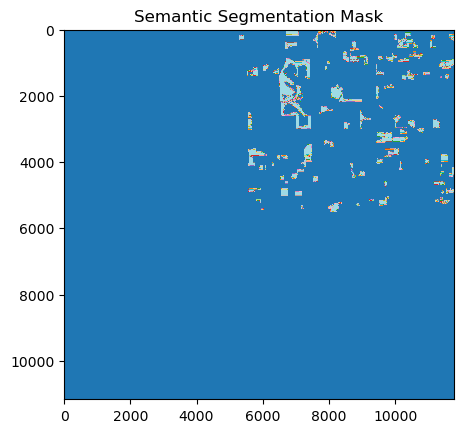

In [3]:
plt.imshow(mask, cmap='tab20')
plt.title('Semantic Segmentation Mask')
plt.axis('on') 
plt.show()

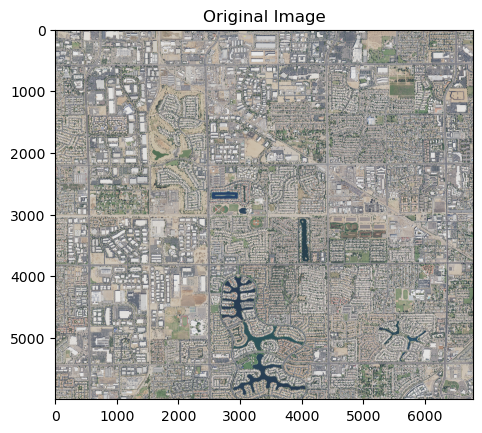

In [4]:
import matplotlib.pyplot as plt
import cv2

image_path = '/Users/bhoumik/Downloads/project-8-at-2024-04-19-02-39-dce009bd/images/cb6ed12f-Gilbert-0000000000-0000000000.png'  # Replace with the actual path to your image

original_image = cv2.imread(image_path)
original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

plt.imshow(original_image[:6000,5000:])
plt.title('Original Image')
plt.axis('on')  
plt.show()


In [5]:
mask=mask[:6000,5000:]

In [6]:
original_image=original_image[:6000,5000:]

In [7]:
mask_colored = cv2.applyColorMap(cv2.convertScaleAbs(mask, alpha=255/mask.max()), cv2.COLORMAP_JET)


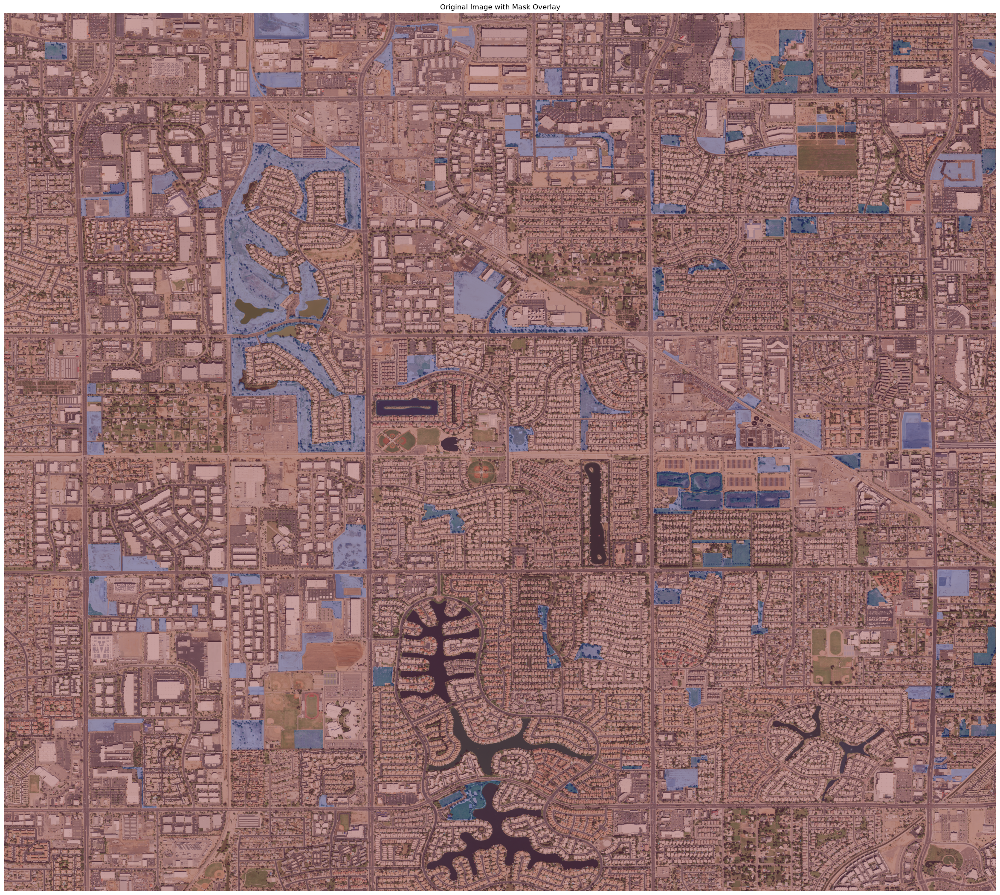

In [8]:



def blend_images(image, mask_colored, opacity=0.3):
    blended = cv2.addWeighted(image, 1-opacity, mask_colored, opacity, 0)
    return blended

opacity = 0.3
blended_image = blend_images(original_image, mask_colored, opacity=opacity)

plt.figure(figsize=(30,30))
plt.imshow(blended_image)
plt.title('Original Image with Mask Overlay')
plt.axis('off')
plt.show()


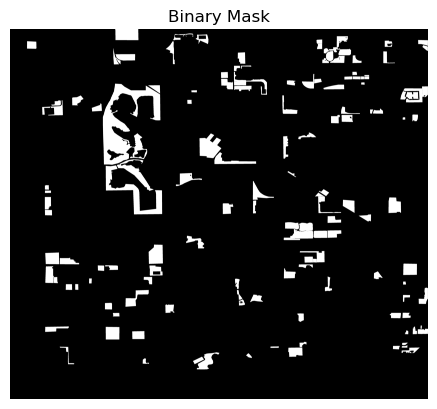

In [9]:
mask_binary = np.where(mask == 1, 255, 0).astype(np.uint8)

plt.imshow(mask_binary, cmap='gray')
plt.title('Binary Mask')
plt.axis('off')  
plt.show()

In [10]:
mask_binary.shape

(6000, 6776)

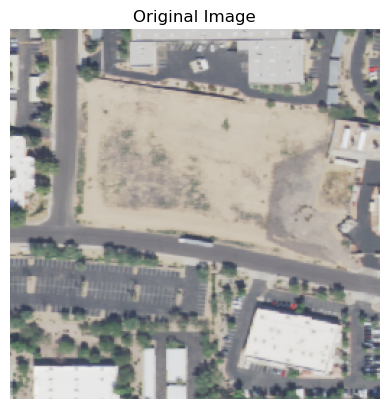

In [11]:
plt.imshow(original_image[:256,:256])
plt.title('Original Image')
plt.axis('off')  
plt.show()


Text(0.5, 1.0, 'Mask')

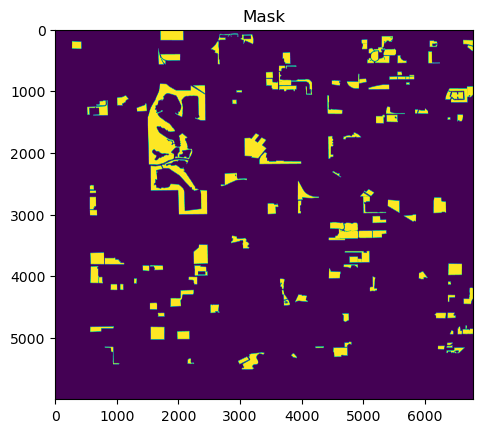

In [13]:
plt.imshow(mask)
plt.title('Mask')

In [ ]:
%matplotlib notebook
import matplotlib.pyplot as plt
from matplotlib.widgets import Button
import numpy as np
import cv2

<IPython.core.display.Javascript object>


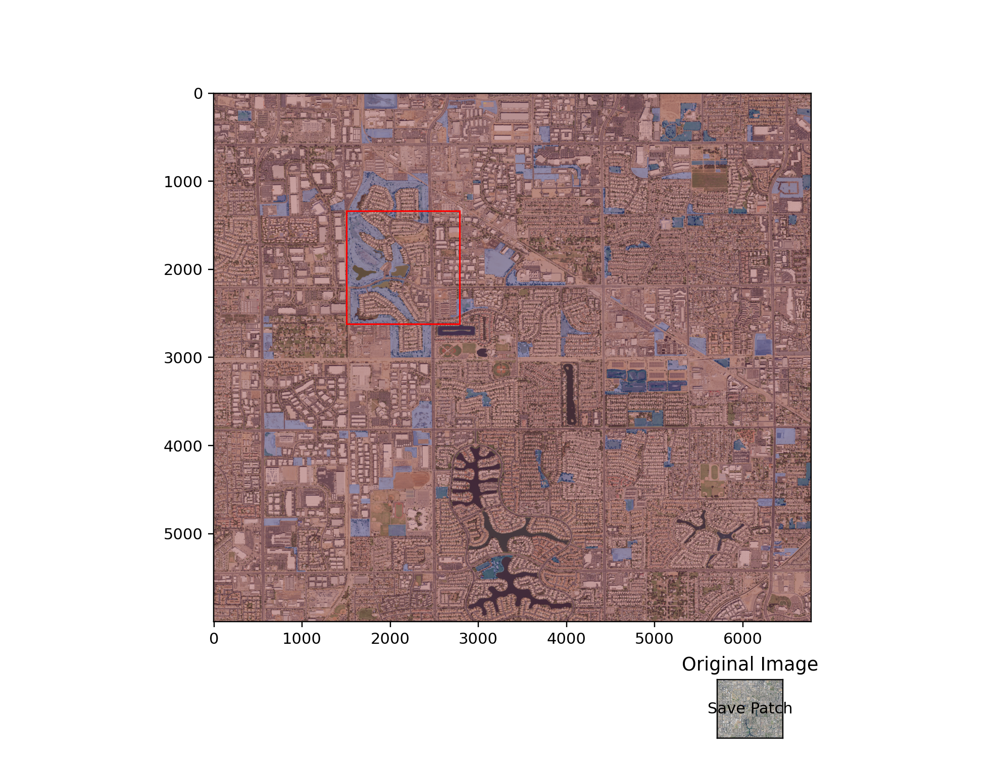

In [15]:
fig, ax = plt.subplots(figsize=(9, 7))
plt.subplots_adjust(bottom=0.2)
ax.imshow(blended_image)

rect = plt.Rectangle((0,0), 512, 5, linewidth=1, edgecolor='r', facecolor='none')
ax.add_patch(rect)
rect.set_visible(False)  

def onclick(event):
    global rect, selected_patch
    if event.inaxes == ax:
        x, y = int(event.xdata), int(event.ydata)
        x_start, y_start = max(x - 128, 0), max(y - 128, 0)

        rect.set_xy((x_start, y_start))
        rect.set_visible(True)

        fig.canvas.draw_idle()

        selected_patch = (x_start, y_start)

def save_patch(event):
    global selected_patch
    if selected_patch is not None:
        x_start, y_start = selected_patch
        image_patch = original_image[y_start:y_start+256, x_start:x_start+256]
        mask_patch = mask[y_start:y_start+256, x_start:x_start+256]

        cv2.imwrite(f'image_patch_{x_start}_{y_start}.png', cv2.cvtColor(image_patch, cv2.COLOR_RGB2BGR))  # Convert RGB to BGR for saving
        cv2.imwrite(f'mask_patch_{x_start}_{y_start}.png', mask_patch * 255)  # Convert mask values to 0 or 255 for saving
    
        print(f"Saved image_patch_{x_start}_{y_start}.png and mask_patch_{x_start}_{y_start}.png")

fig.canvas.mpl_connect('button_press_event', onclick)

ax_save = plt.axes([0.7, 0.05, 0.1, 0.075])
btn_save = Button(ax_save, 'Save Patch')
btn_save.on_clicked(save_patch)

plt.show()